<h2 style="color:#d84bff">MACHINE LEARNING MODELS TO PREDICT WHETHER IT WILL RAIN OR NOT TOMORROW AND THE AMOUNT OF RAINFALL</h2>

<p style="font-size:140%;color:#38c684">Importing the necessary libraries</p>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

<p style="font-size:140%;color:#38c684">Importing the Dataset</p>

In [2]:
df = pd.read_csv('Rainfall.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


<h2>EXPLORATORY DATA ANALYSIS</h2>

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.iloc[20]

Date             2008-12-21
Location             Albury
MinTemp                11.5
MaxTemp                29.3
Rainfall                0.0
Evaporation             NaN
Sunshine                NaN
WindGustDir               S
WindGustSpeed          24.0
WindDir9am               SE
WindDir3pm               SE
WindSpeed9am            9.0
WindSpeed3pm            9.0
Humidity9am            56.0
Humidity3pm            28.0
Pressure9am          1019.3
Pressure3pm          1014.8
Cloud9am                NaN
Cloud3pm                NaN
Temp9am                19.1
Temp3pm                27.3
RainToday                No
RainTomorrow             No
Name: 20, dtype: object

In [5]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

<p style="font-size:140%;color:#a1606a">Checking is there are null values present in the dataset or not ? </p>

In [7]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [8]:
df.isnull().sum().sum()

19472

<p style="font-size:140%;color:#3b9df3">There are 19472 null values in the dataset and most of them are in the Evaporation and Sunshine columns</p>

<p style="font-size:140%;color:#38c684">Checking for duplicate records</p>

In [9]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
8420    False
8421    False
8422    False
8423    False
8424    False
Length: 8425, dtype: bool

In [10]:
df.duplicated().sum()

1663

<p style="font-size:140%;color:#aa0000">There are 1664 duplicate records in the dataset.</p>

In [11]:
df.shape

(8425, 23)

In [12]:
pd.set_option('display.max_columns', 100)

In [13]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [14]:
df.skew(axis=0, skipna=True, numeric_only=True)

MinTemp          -0.089588
MaxTemp           0.379297
Rainfall         13.028837
Evaporation      10.710605
Sunshine         -0.519717
WindGustSpeed     0.711103
WindSpeed9am      0.956250
WindSpeed3pm      0.491069
Humidity9am      -0.255843
Humidity3pm       0.117563
Pressure9am      -0.022133
Pressure3pm      -0.009385
Cloud9am         -0.309417
Cloud3pm         -0.232598
Temp9am          -0.014699
Temp3pm           0.395061
dtype: float64

In [15]:
df.kurt(axis=0, skipna=True, numeric_only=True)

MinTemp           -0.583766
MaxTemp           -0.258302
Rainfall         303.184680
Evaporation      251.470716
Sunshine          -0.865516
WindGustSpeed      0.551310
WindSpeed9am       1.081869
WindSpeed3pm       0.334933
Humidity9am       -0.378074
Humidity3pm       -0.338751
Pressure9am        0.026735
Pressure3pm        0.021548
Cloud9am          -1.494257
Cloud3pm          -1.467532
Temp9am           -0.444168
Temp3pm           -0.180550
dtype: float64

In [16]:
df.kurtosis(axis=0, skipna=True, numeric_only=True)

MinTemp           -0.583766
MaxTemp           -0.258302
Rainfall         303.184680
Evaporation      251.470716
Sunshine          -0.865516
WindGustSpeed      0.551310
WindSpeed9am       1.081869
WindSpeed3pm       0.334933
Humidity9am       -0.378074
Humidity3pm       -0.338751
Pressure9am        0.026735
Pressure3pm        0.021548
Cloud9am          -1.494257
Cloud3pm          -1.467532
Temp9am           -0.444168
Temp3pm           -0.180550
dtype: float64

In [17]:
#There are 4 columns which have high skewness

<h2>DATA VISUALIZATION</h2>

<Axes: xlabel='RainTomorrow', ylabel='count'>

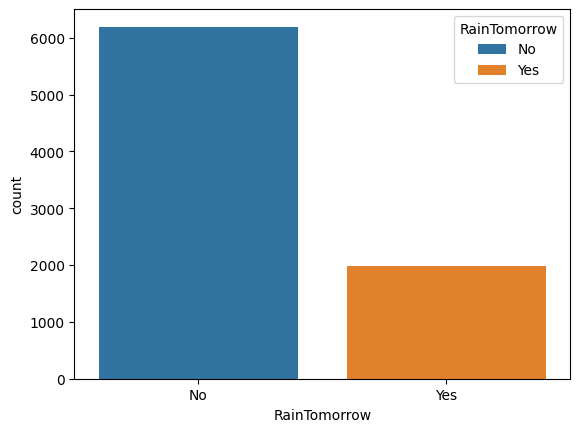

In [18]:
sns.countplot(data=df, x='RainTomorrow',hue='RainTomorrow')

In [19]:
#This is an imbalanced dataset

<Figure size 2000x2000 with 0 Axes>

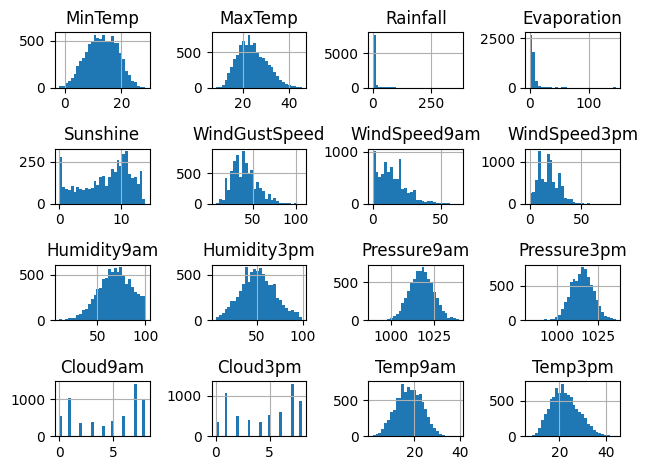

In [20]:
plt.figure(figsize=(20,20))
df.hist(bins=30)
plt.tight_layout()

In [21]:
df.corr(numeric_only=True)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
MinTemp,1.000000,0.720955,0.091642,0.348643,0.081365,0.241317,0.137263,0.180091,-0.130906,0.079569,-0.465478,-0.458665,0.111213,0.046889,0.888342,0.689652
MaxTemp,0.720955,1.000000,-0.088906,0.424728,0.523909,0.146113,0.013425,0.088797,-0.392496,-0.424217,-0.347285,-0.430074,-0.307700,-0.301675,0.869503,0.978665
Rainfall,0.091642,-0.088906,1.000000,0.043463,-0.209654,0.104999,0.051349,0.025185,0.231702,0.238730,-0.080412,-0.037270,0.195157,0.159250,-0.007191,-0.092263
Evaporation,0.348643,0.424728,0.043463,1.000000,0.340893,0.214069,0.176701,0.142421,-0.286869,-0.221244,-0.218171,-0.233401,-0.084288,-0.152637,0.405467,0.414156
Sunshine,0.081365,0.523909,-0.209654,0.340893,1.000000,-0.018455,-0.025112,0.045031,-0.512349,-0.630536,0.028666,-0.047098,-0.705577,-0.723957,0.348708,0.546057
WindGustSpeed,0.241317,0.146113,0.104999,0.214069,-0.018455,1.000000,0.656079,0.711403,-0.286045,-0.097380,-0.430736,-0.394745,0.030124,0.104157,0.211477,0.106872
WindSpeed9am,0.137263,0.013425,0.051349,0.176701,-0.025112,0.656079,1.000000,0.566322,-0.358981,-0.111595,-0.197189,-0.156517,-0.000607,0.068930,0.109936,-0.002619
WindSpeed3pm,0.180091,0.088797,0.025185,0.142421,0.045031,0.711403,0.566322,1.000000,-0.252488,-0.091248,-0.291271,-0.240378,0.005807,0.003894,0.185329,0.066201
Humidity9am,-0.130906,-0.392496,0.231702,-0.286869,-0.512349,-0.286045,-0.358981,-0.252488,1.000000,0.636255,0.154699,0.188463,0.472126,0.352736,-0.378389,-0.383788
Humidity3pm,0.079569,-0.424217,0.238730,-0.221244,-0.630536,-0.097380,-0.111595,-0.091248,0.636255,1.000000,0.001763,0.076002,0.509797,0.520221,-0.130973,-0.491634


<Axes: >

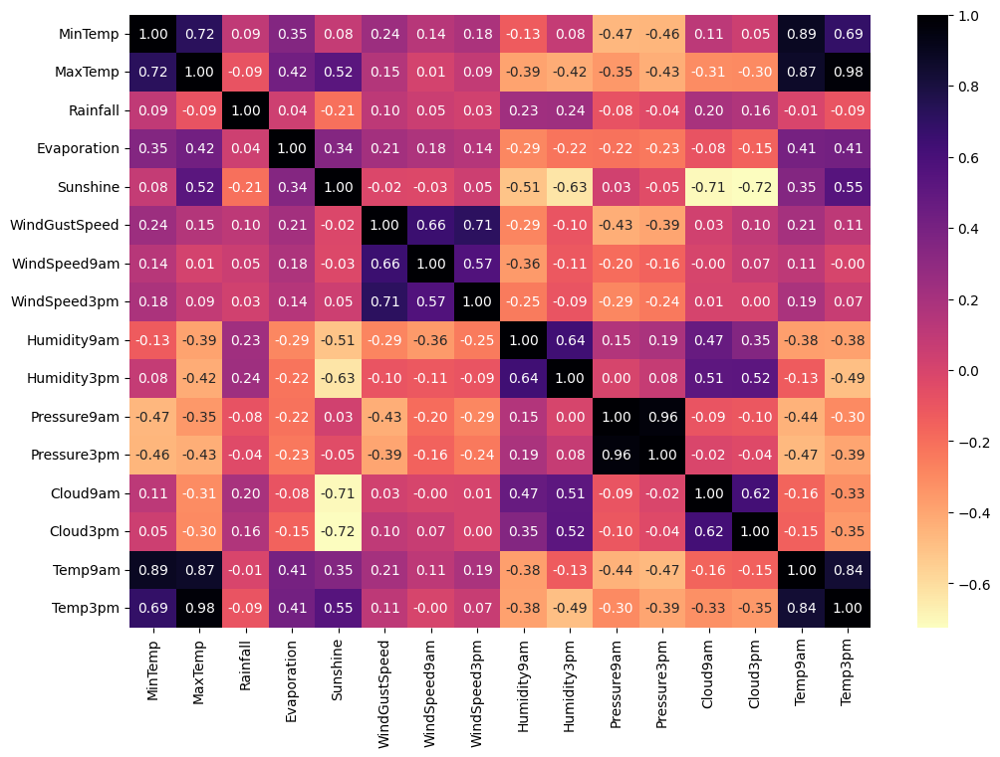

In [22]:
plt.figure(figsize=(12,8))
sns.heatmap(data=df.corr(numeric_only=True), annot=True,fmt='0.2f', cmap='magma_r')

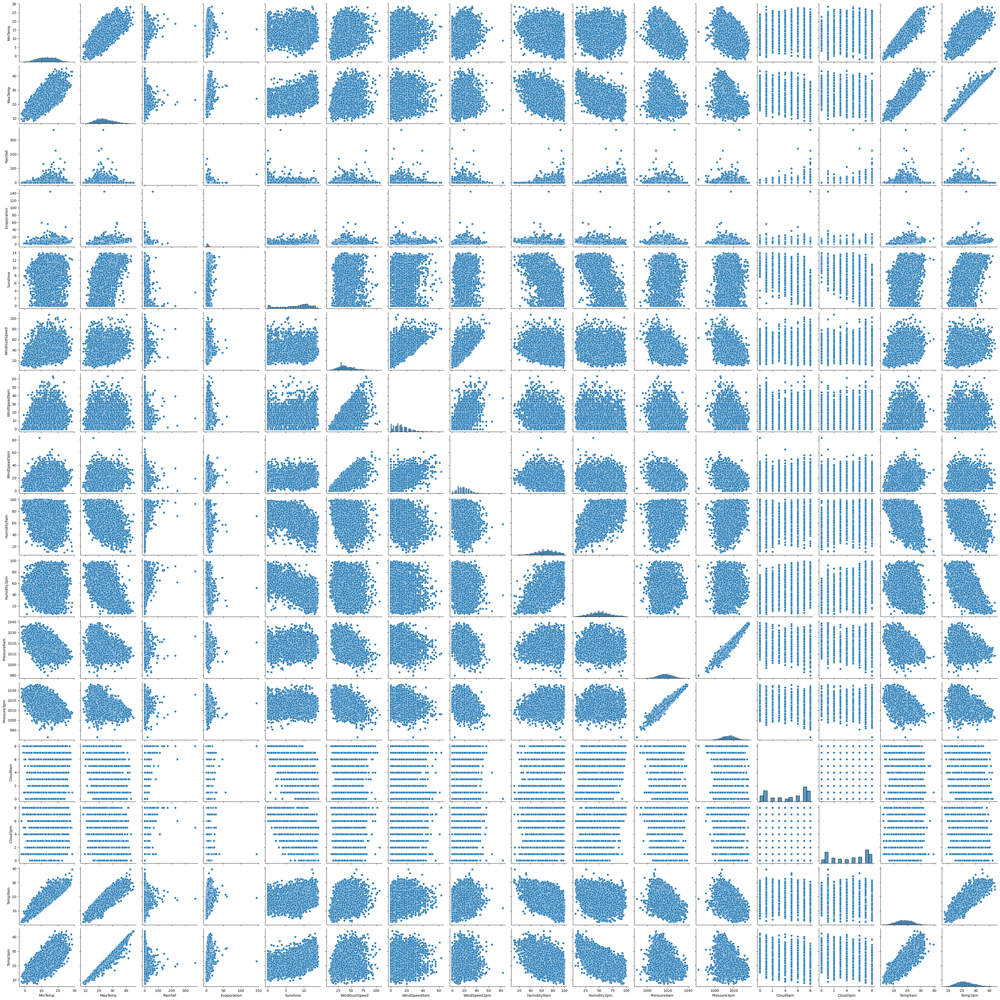

In [23]:
sns.pairplot(data=df)

In [24]:
num_cols = []
cat_cols=[]
for x in df.columns:
    if df[x].dtype!='object':
        print(x, df[x].dtype)
        num_cols.append(x)
    else:
        print(x, df[x].dtype)
        cat_cols.append(x)


Date object
Location object
MinTemp float64
MaxTemp float64
Rainfall float64
Evaporation float64
Sunshine float64
WindGustDir object
WindGustSpeed float64
WindDir9am object
WindDir3pm object
WindSpeed9am float64
WindSpeed3pm float64
Humidity9am float64
Humidity3pm float64
Pressure9am float64
Pressure3pm float64
Cloud9am float64
Cloud3pm float64
Temp9am float64
Temp3pm float64
RainToday object
RainTomorrow object


In [25]:
num_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [26]:
cat_cols

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [27]:
import warnings
warnings.filterwarnings(action='ignore')

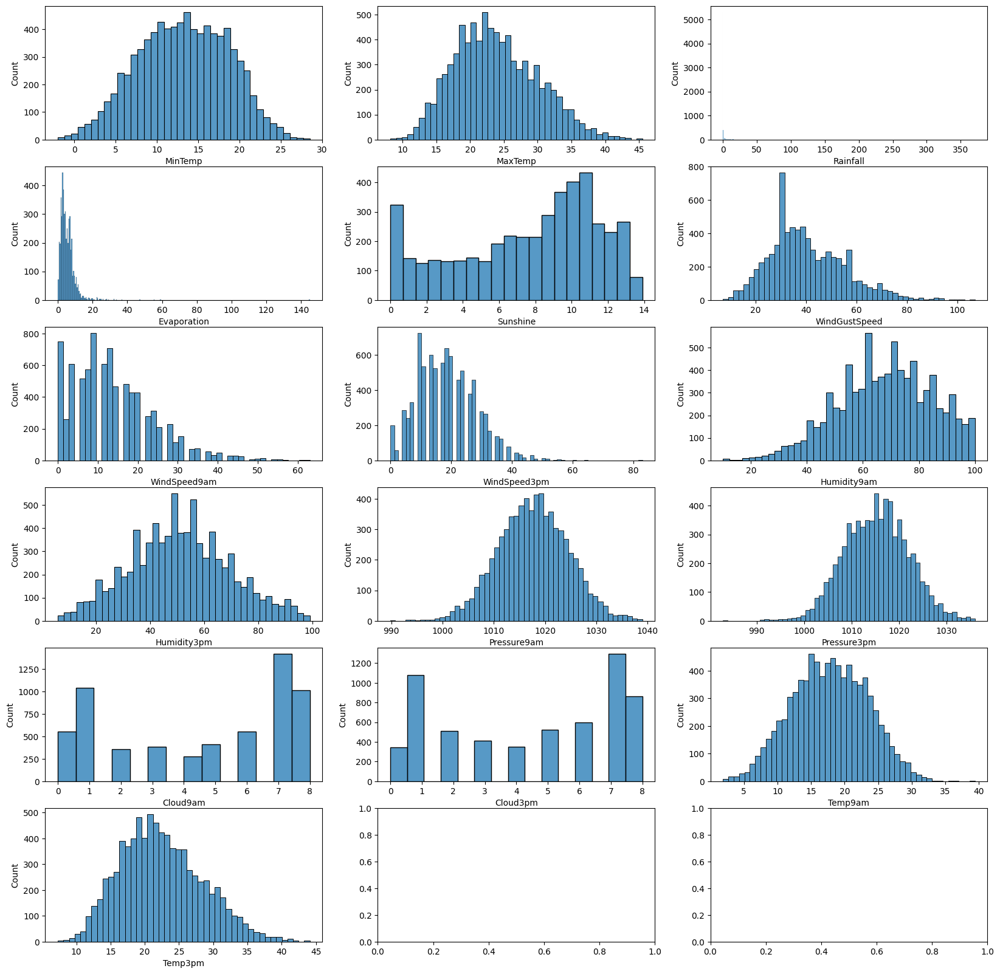

In [28]:
fig, axes = plt.subplots(6,3, figsize=(20,20))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(6,3, plotnumber)
    sns.histplot(data=df, x=x)
    plotnumber += 1

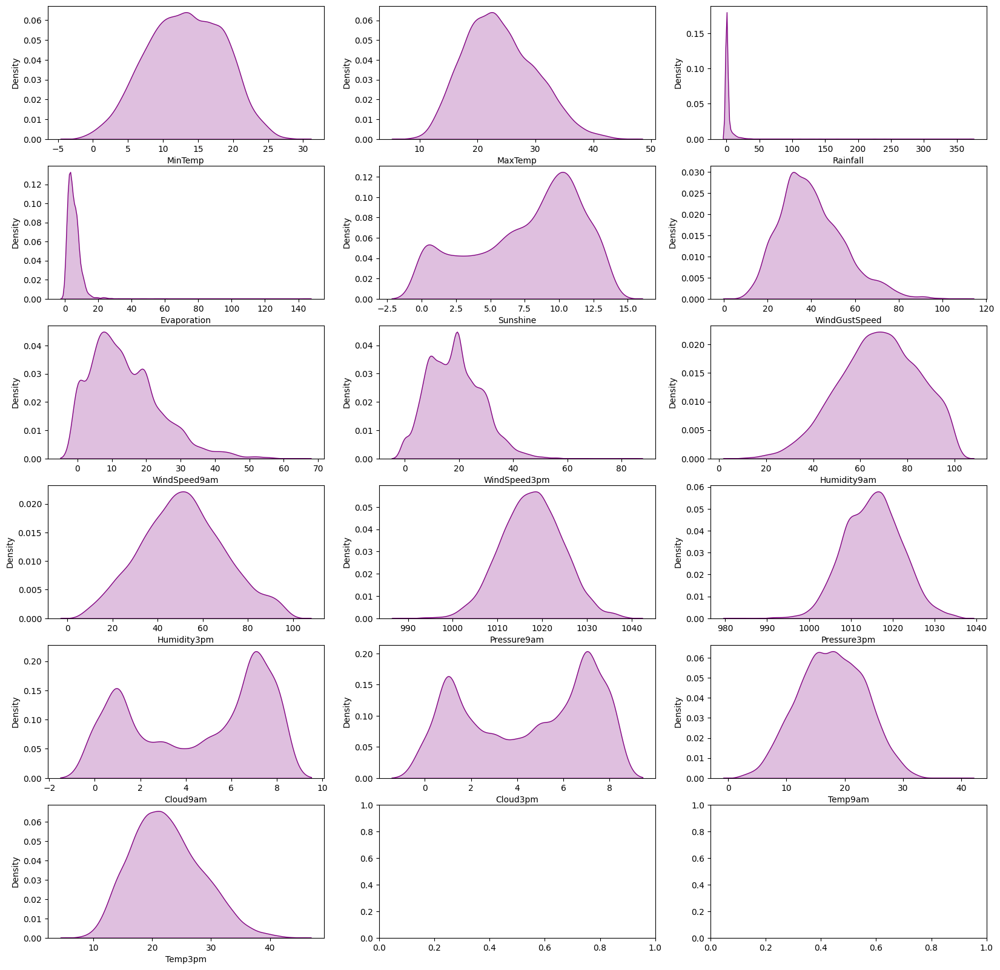

In [29]:
fig, axes = plt.subplots(6,3, figsize=(20,20))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(6,3, plotnumber)
    sns.kdeplot(data=df, x=x, fill=True, color='purple')
    plotnumber += 1

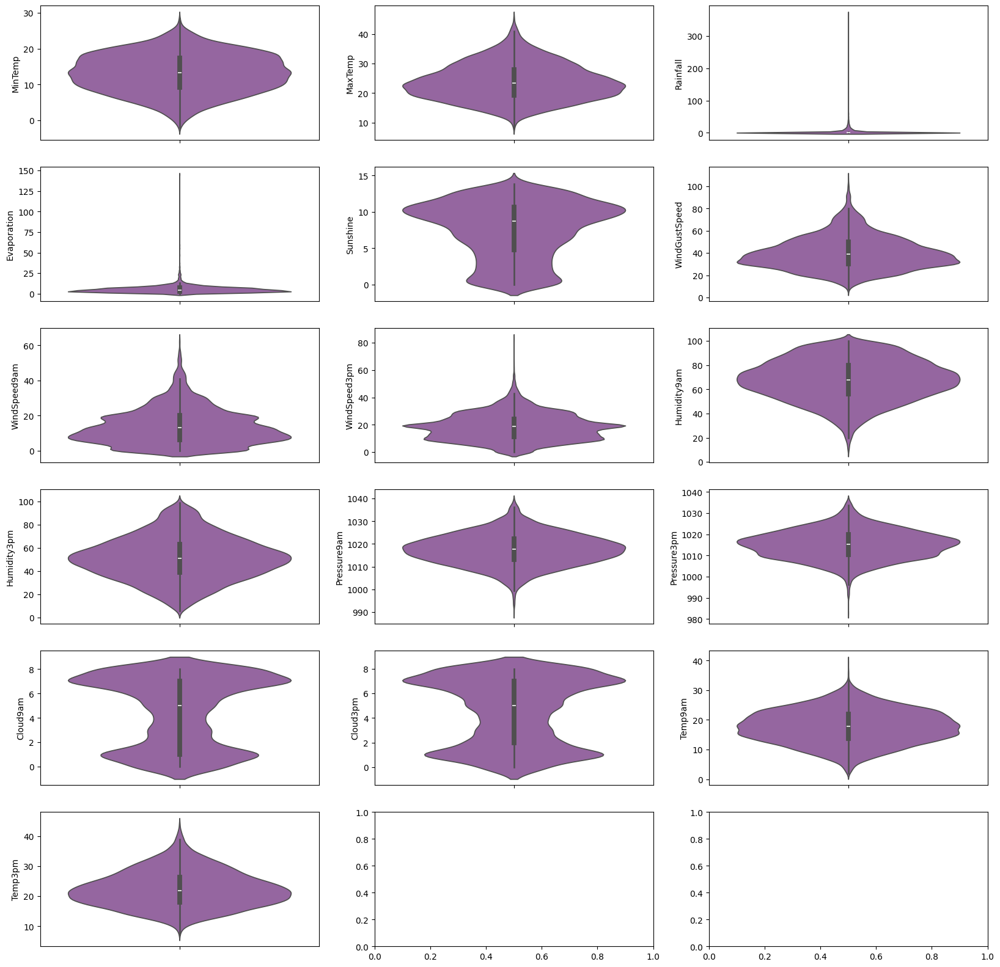

In [30]:
fig, axes = plt.subplots(6,3, figsize=(20,20))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(6,3, plotnumber)
    sns.violinplot(data=df, y=x, color='#9b5caa')
    plotnumber += 1

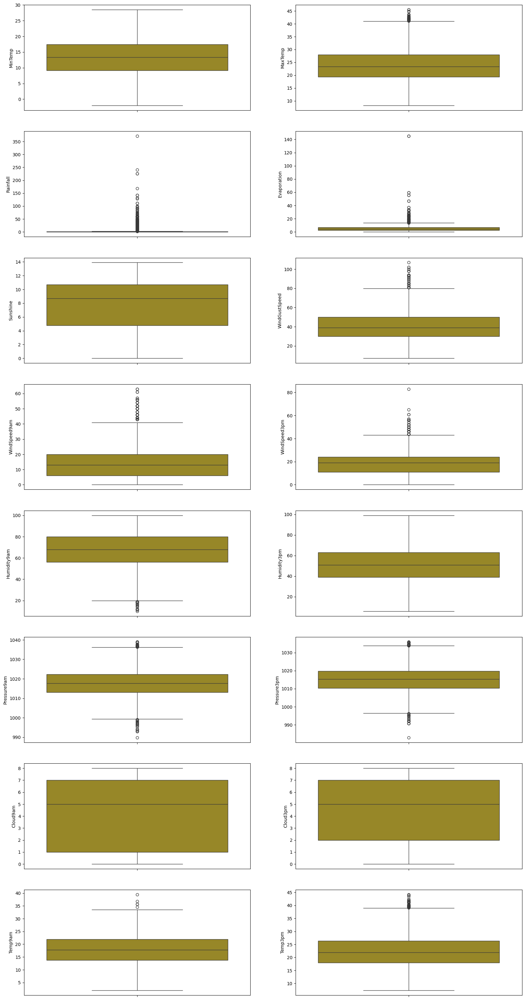

In [31]:
fig, axes = plt.subplots(8,2, figsize=(20,40))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(8,2, plotnumber)
    sns.boxplot(data=df, y=x, color='#aa9415',)
    plotnumber += 1

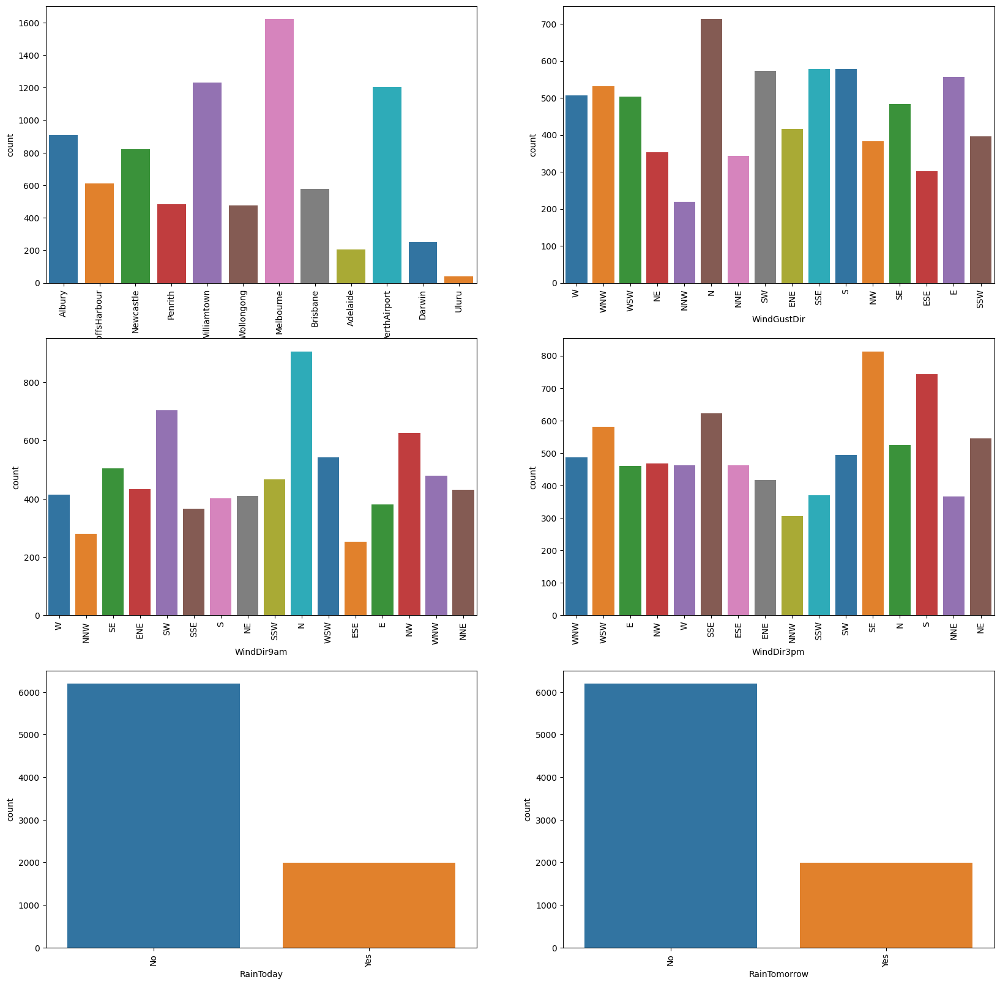

In [32]:
fig, axes = plt.subplots(3,2, figsize=(20,20))
plotnumber = 1
for x in cat_cols[1:]:
    ax = plt.subplot(3,2, plotnumber)
    sns.countplot(data=df, x=x, palette='tab10')
    plt.xticks(rotation=90)
    plotnumber += 1

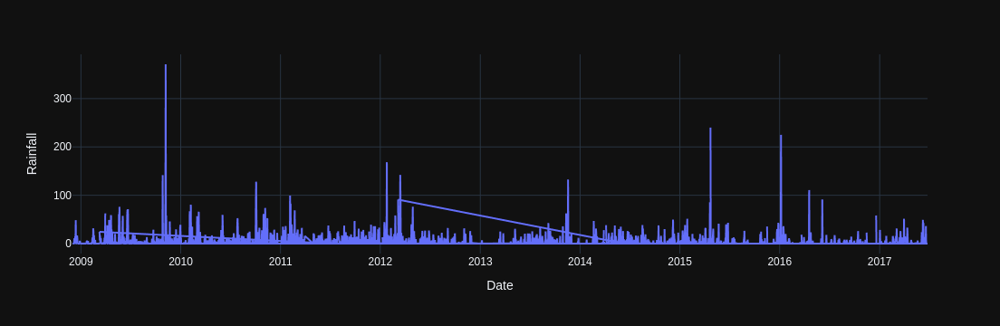

In [33]:
px.line(data_frame=df, y='Rainfall',x='Date',template='plotly_dark')

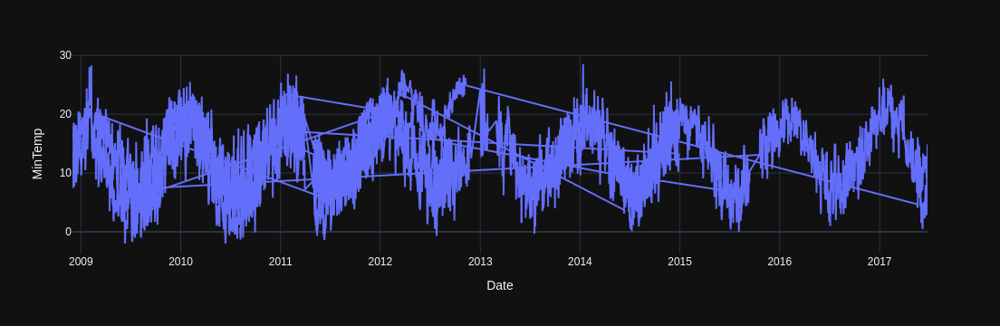

In [34]:
px.line(data_frame=df, y='MinTemp', x='Date', template='plotly_dark')

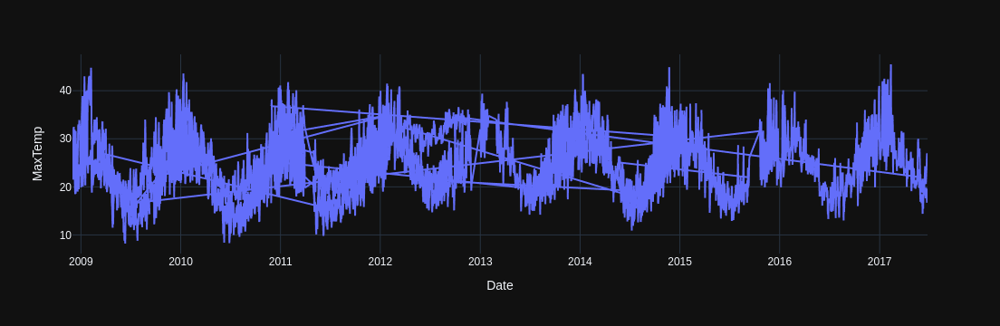

In [35]:
px.line(data_frame=df, y='MaxTemp', x='Date', template='plotly_dark')

In [36]:
df.groupby(by='Location')['MinTemp'].mean()

Location
Adelaide        10.980000
Albury          10.045233
Brisbane        15.372837
CoffsHarbour    13.705082
Darwin          21.324800
Melbourne       12.443280
Newcastle       12.918325
Penrith         11.279668
PerthAirport    13.172674
Uluru            5.997436
Williamtown     14.247557
Wollongong      15.442918
Name: MinTemp, dtype: float64

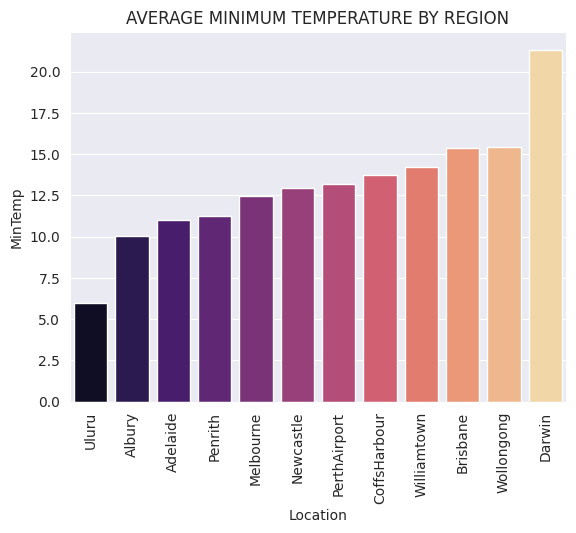

In [37]:
sns.set_style('darkgrid')
sns.barplot(data=df.groupby(by='Location')['MinTemp'].mean().sort_values(ascending=True), palette='magma')
plt.xticks(rotation=90)
plt.title('AVERAGE MINIMUM TEMPERATURE BY REGION')
plt.show()

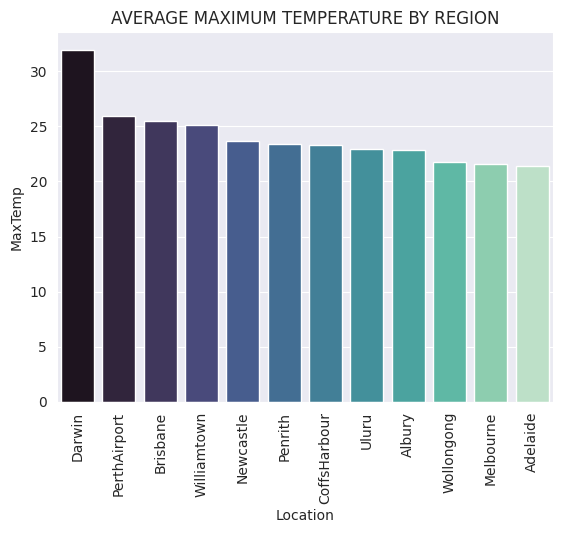

In [38]:
sns.barplot(data=df.groupby(by='Location')['MaxTemp'].mean().sort_values(ascending=False), palette='mako')
plt.xticks(rotation=90)
plt.title('AVERAGE MAXIMUM TEMPERATURE BY REGION')
plt.show()

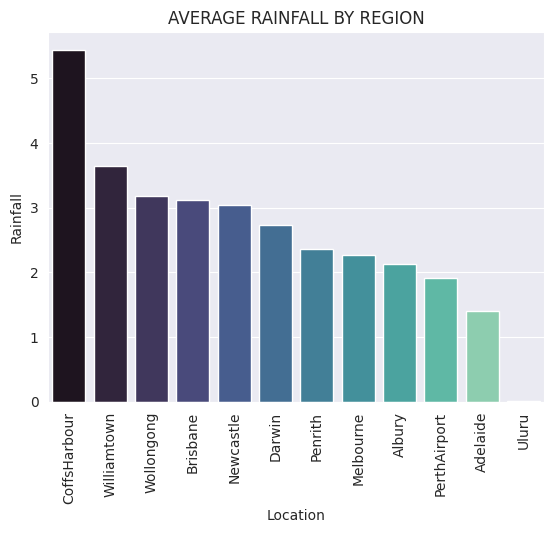

In [39]:
sns.barplot(data=df.groupby(by='Location')['Rainfall'].mean().sort_values(ascending=False), palette='mako')
plt.xticks(rotation=90)
plt.title('AVERAGE RAINFALL BY REGION')
plt.show()

In [40]:
pd.crosstab(index=df['Location'], columns=df['RainTomorrow'])

RainTomorrow,No,Yes
Location,,
Adelaide,156,45
Albury,699,199
Brisbane,439,135
CoffsHarbour,424,186
Darwin,218,32
Melbourne,1096,406
Newcastle,610,198
Penrith,363,116
PerthAirport,962,242


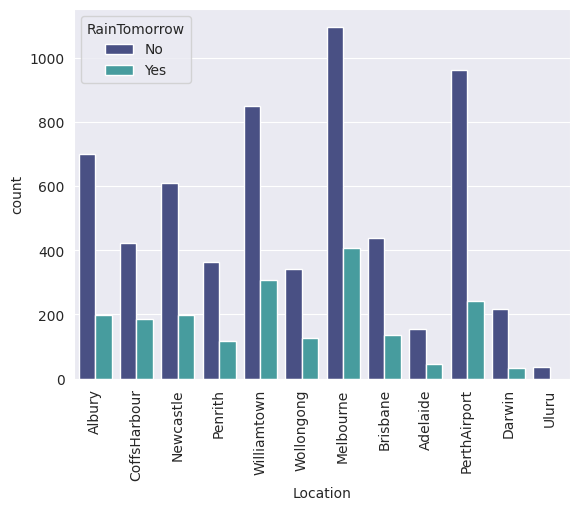

In [41]:
sns.countplot(data=df, hue='RainTomorrow', x='Location', palette='mako')
plt.xticks(rotation=90)
plt.show()

In [42]:
pd.crosstab(index=df['Location'], columns=df['RainToday'])

RainToday,No,Yes
Location,,
Adelaide,157,44
Albury,699,199
Brisbane,439,135
CoffsHarbour,423,187
Darwin,217,33
Melbourne,1098,404
Newcastle,610,198
Penrith,363,116
PerthAirport,962,242


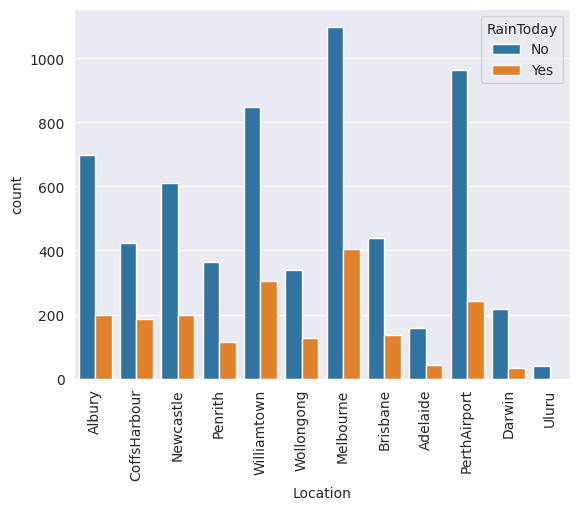

In [43]:
sns.countplot(data=df, x='Location', hue='RainToday')
plt.xticks(rotation=90)
plt.show()

In [44]:
df['Date'] = df['Date'].astype('datetime64[ns]')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [45]:
df['Date'].dtype

dtype('<M8[ns]')

In [46]:
df['Year'] = df['Date'].apply(lambda x:x.year)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,2008
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,2008
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,2008
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,2008
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,2017
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,2017
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,2017
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,2017


In [47]:
df['Month'] = df['Date'].apply(lambda x:x.month)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,2017,6
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,2017,6
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,2017,6
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,2017,6


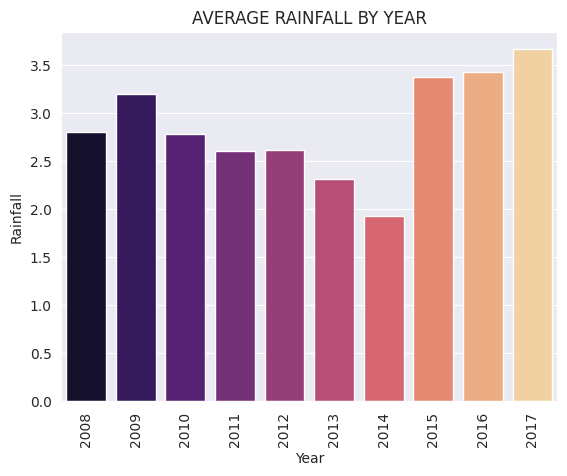

In [48]:
sns.barplot(data=df.groupby(by='Year')['Rainfall'].mean().sort_values(ascending=True), palette='magma')
plt.xticks(rotation=90)
plt.title('AVERAGE RAINFALL BY YEAR')
plt.show()

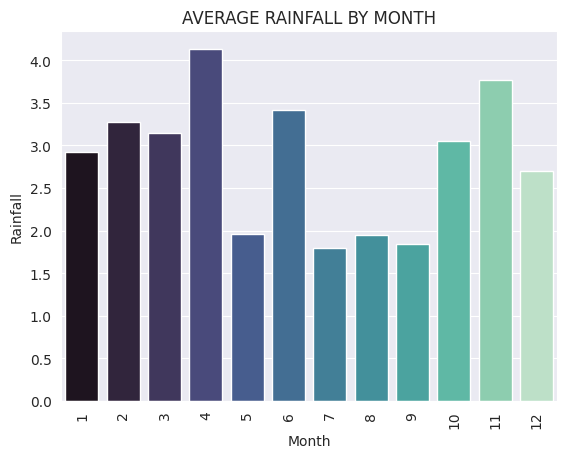

In [49]:
sns.barplot(data=df.groupby(by='Month')['Rainfall'].mean().sort_values(ascending=False), palette='mako')
plt.xticks(rotation=90)
plt.title('AVERAGE RAINFALL BY MONTH')
plt.show()

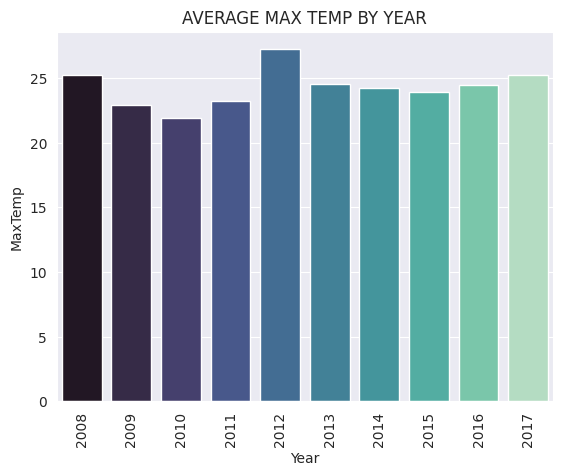

In [50]:
sns.barplot(data=df.groupby(by='Year')['MaxTemp'].mean().sort_values(ascending=False), palette='mako')
plt.xticks(rotation=90)
plt.title('AVERAGE MAX TEMP BY YEAR')
plt.show()

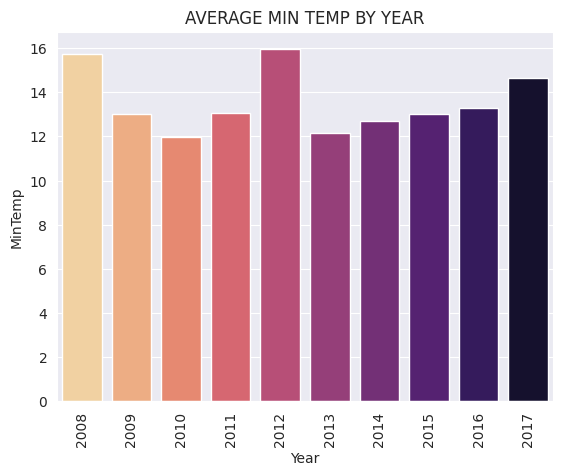

In [51]:
sns.barplot(data=df.groupby(by='Year')['MinTemp'].mean().sort_values(ascending=False), palette='magma_r')
plt.xticks(rotation=90)
plt.title('AVERAGE MIN TEMP BY YEAR')
plt.show()

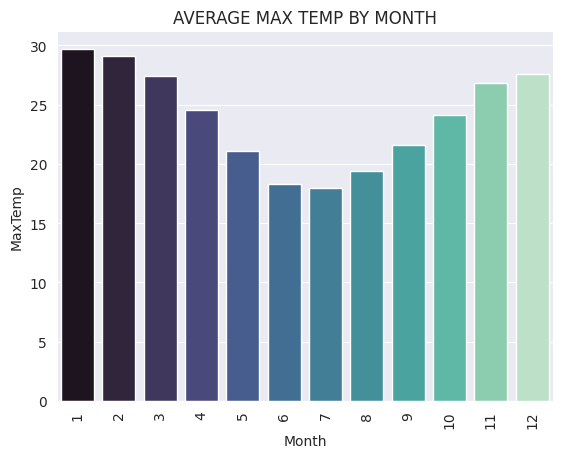

In [52]:
sns.barplot(data=df.groupby(by='Month')['MaxTemp'].mean().sort_values(ascending=False), palette='mako')
plt.xticks(rotation=90)
plt.title('AVERAGE MAX TEMP BY MONTH')
plt.show()

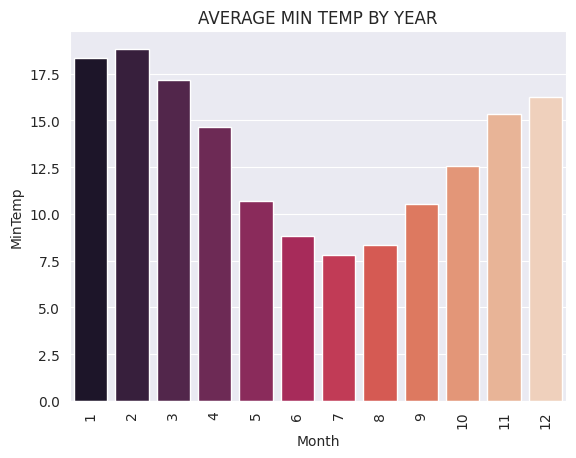

In [53]:
sns.barplot(data=df.groupby(by='Month')['MinTemp'].mean().sort_values(ascending=False), palette='rocket')
plt.xticks(rotation=90)
plt.title('AVERAGE MIN TEMP BY YEAR')
plt.show()

Text(0, 0.5, 'WIndSpeed')

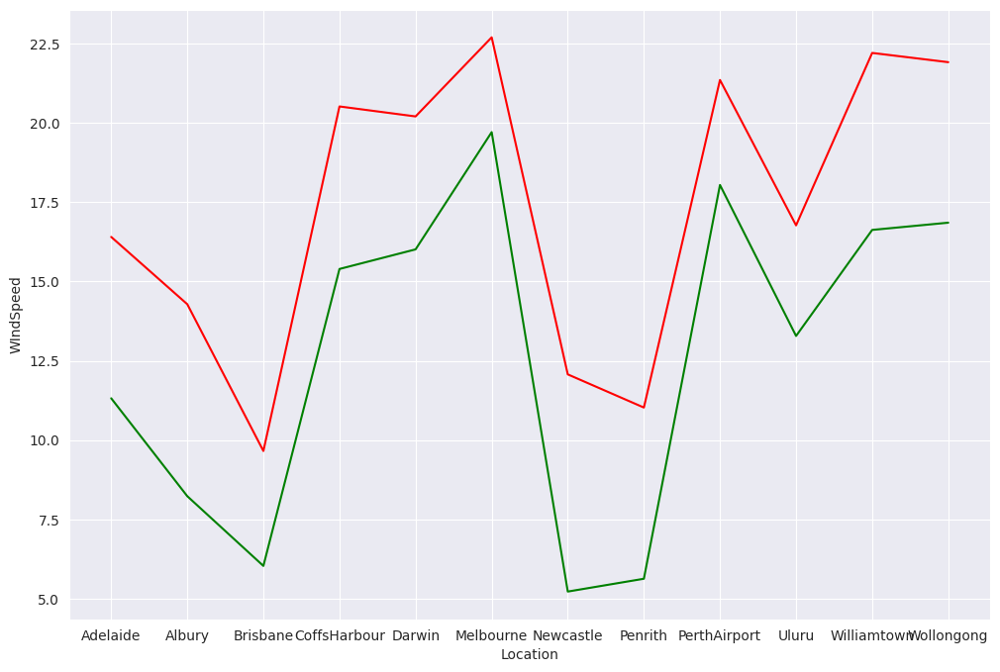

In [54]:
plt.figure(figsize=(12,8))
sns.lineplot(data=df.groupby(by='Location')['WindSpeed9am'].mean(), color='green') 
sns.lineplot(data=df.groupby(by='Location')['WindSpeed3pm'].mean(), color='red') 
plt.ylabel('WIndSpeed')

In [55]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Year', 'Month'],
      dtype='object')

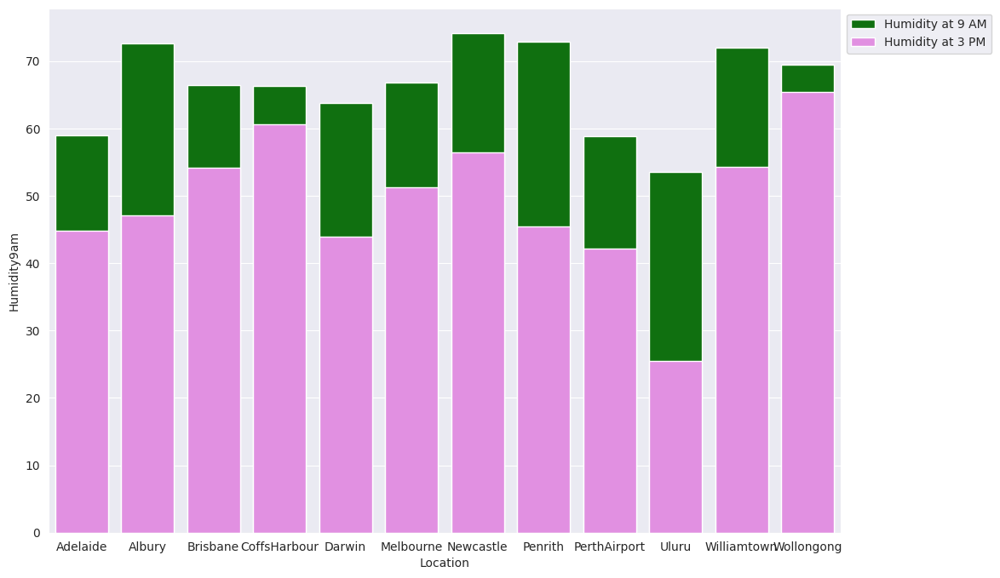

In [56]:
plt.figure(figsize=(12,8))
sns.barplot(data=df.groupby(by='Location')['Humidity9am'].mean(),color='green', label='Humidity at 9 AM') 
sns.barplot(data=df.groupby(by='Location')['Humidity3pm'].mean(),color='violet', label='Humidity at 3 PM')
plt.legend(bbox_to_anchor=(1,1))

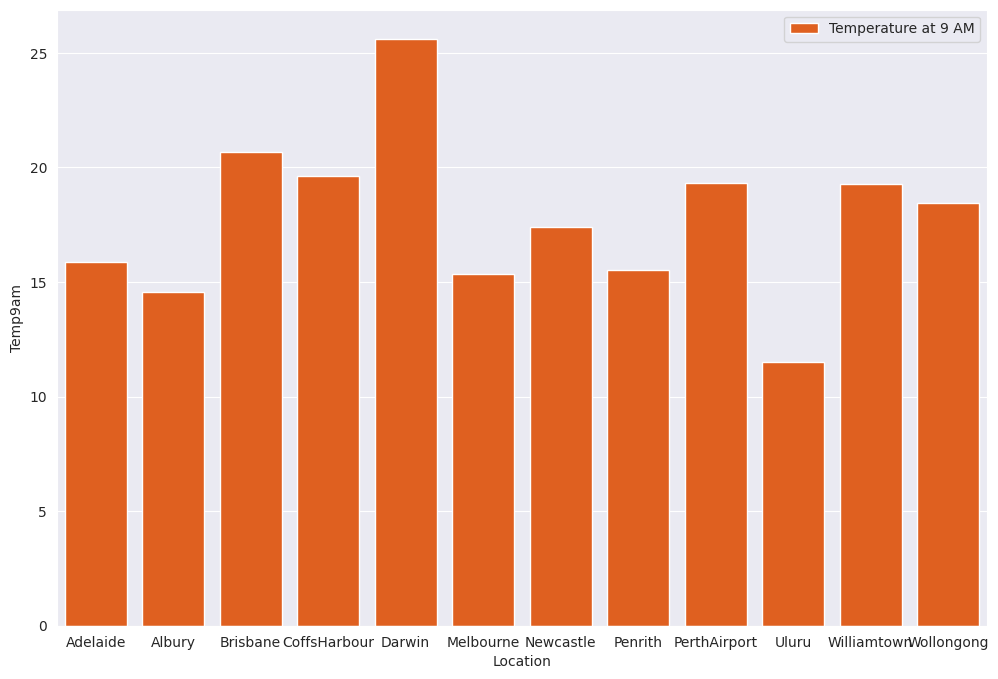

In [57]:
plt.figure(figsize=(12,8))
sns.barplot(data=df.groupby(by='Location')['Temp9am'].mean(),color='#ff5500', label='Temperature at 9 AM') 
plt.legend(bbox_to_anchor=(1,1))
plt.show()

<Axes: xlabel='Location', ylabel='Temp3pm'>

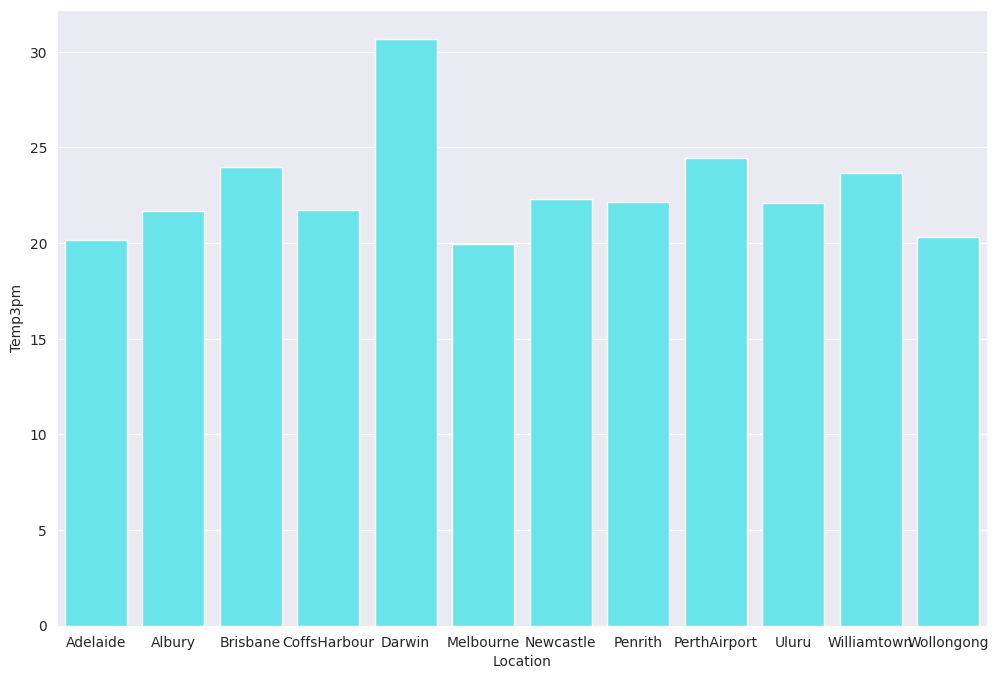

In [58]:
plt.figure(figsize=(12,8))
sns.barplot(data=df.groupby(by='Location')['Temp3pm'].mean(),color='#54f7ff', label='Temperature at 3 PM', )

In [59]:
#above are some insights about the dataset

<h2>FEATURE ENGINEERING</h2>

<p style="font-size:120%;color:#b6b600">We have to fill all null values with numerical columns which have null values to be filled with mean value and categorical column null values to be filled with the most frequent value.</p>

In [60]:
for x in num_cols:
    df[x] = df[x].fillna(df[x].mean())
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month
0,2008-12-01,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12
1,2008-12-02,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12
2,2008-12-03,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12
3,2008-12-04,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12
4,2008-12-05,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6
8421,2017-06-22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6
8422,2017-06-23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6
8423,2017-06-24,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6


In [61]:
df.isnull().sum()

Date               0
Location           0
MinTemp            0
MaxTemp            0
Rainfall           0
Evaporation        0
Sunshine           0
WindGustDir      991
WindGustSpeed      0
WindDir9am       829
WindDir3pm       308
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday        240
RainTomorrow     239
Year               0
Month              0
dtype: int64

In [62]:
#Now you can see that all numerical columns have no null values.
#Now, we will use Simple Imputer to fill null values of Categorical columns

In [63]:
from sklearn.impute import SimpleImputer

In [64]:
si = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

In [65]:
for x in cat_cols[1:]:
    df[[x]] = si.fit_transform(df[[x]])
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month
0,2008-12-01,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12
1,2008-12-02,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12
2,2008-12-03,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12
3,2008-12-04,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12
4,2008-12-05,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6
8421,2017-06-22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6
8422,2017-06-23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6
8423,2017-06-24,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6


In [66]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Year             0
Month            0
dtype: int64

In [67]:
df.drop('Date', axis=1, inplace=True)
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6


<h2>DATA PREPROCESSING ⤵️</h2>

<h3 style="color:#4b9088">FEATURE EXTRACTION : </h3>

<p style="font-size:140%; color:maroon">['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
]</p>


In [68]:
df = pd.get_dummies(data=df, columns=['Location','WindGustDir','WindDir9am','WindDir3pm',], dtype=int, drop_first=True)
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,13.4,22.900000,0.6,5.389395,7.632205,44.000000,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,7.4,25.100000,0.0,5.389395,7.632205,44.000000,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,12.9,25.700000,0.0,5.389395,7.632205,46.000000,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,9.2,28.000000,0.0,5.389395,7.632205,24.000000,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,17.5,32.300000,1.0,5.389395,7.632205,41.000000,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,0.0,5.389395,7.632205,31.000000,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8421,3.6,25.300000,0.0,5.389395,7.632205,22.000000,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8422,5.4,26.900000,0.0,5.389395,7.632205,37.000000,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8423,7.8,27.000000,0.0,5.389395,7.632205,28.000000,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


<p style="font-size:140%; color:#794b90">Now, we use apply Label Encoding on RainToday and RainTomorrow.</p>

In [69]:
from sklearn.preprocessing import LabelEncoder

In [70]:
enc = LabelEncoder()

In [71]:
df['RainToday'] = enc.fit_transform(df['RainToday'])
df['RainTomorrow'] = enc.fit_transform(df['RainTomorrow'])
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,13.4,22.900000,0.6,5.389395,7.632205,44.000000,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,7.4,25.100000,0.0,5.389395,7.632205,44.000000,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,12.9,25.700000,0.0,5.389395,7.632205,46.000000,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,9.2,28.000000,0.0,5.389395,7.632205,24.000000,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,17.5,32.300000,1.0,5.389395,7.632205,41.000000,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,0.0,5.389395,7.632205,31.000000,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8421,3.6,25.300000,0.0,5.389395,7.632205,22.000000,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8422,5.4,26.900000,0.0,5.389395,7.632205,37.000000,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8423,7.8,27.000000,0.0,5.389395,7.632205,28.000000,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


<p style="font-size:140%; color:#ff5500">Now, we will remove skewness in one column i.e. Evaporation which has a really high skewness of 14 and rainfall skewness we will not remove because it is one of the two target variables.</p>

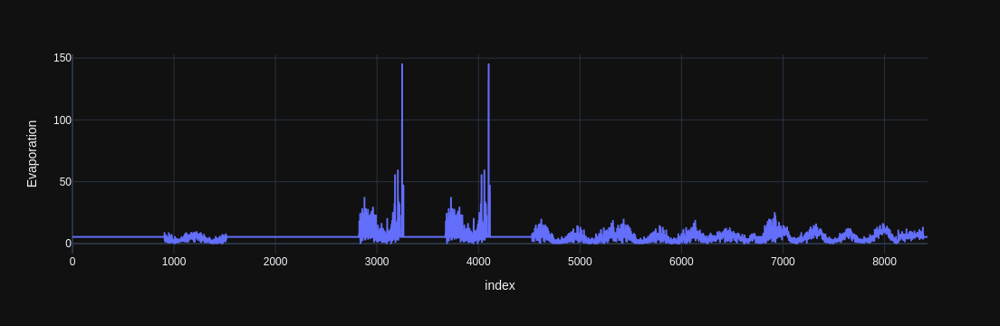

In [72]:
px.line(data_frame=df, y='Evaporation', template='plotly_dark')

In [73]:
from sklearn.preprocessing import PowerTransformer

In [74]:
powertransformer = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)

In [75]:
df['Evaporation'] = powertransformer.fit_transform(df[['Evaporation']])
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,13.4,22.900000,0.6,0.195503,7.632205,44.000000,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,7.4,25.100000,0.0,0.195503,7.632205,44.000000,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,12.9,25.700000,0.0,0.195503,7.632205,46.000000,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,9.2,28.000000,0.0,0.195503,7.632205,24.000000,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,17.5,32.300000,1.0,0.195503,7.632205,41.000000,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,2008,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,0.0,0.195503,7.632205,31.000000,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8421,3.6,25.300000,0.0,0.195503,7.632205,22.000000,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8422,5.4,26.900000,0.0,0.195503,7.632205,37.000000,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8423,7.8,27.000000,0.0,0.195503,7.632205,28.000000,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0,2017,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


<p style="font-size:200%; color:#1ea735">Splitting the dataset into Training and Testing dataset. ⤵️</p>

In [76]:
from sklearn.model_selection import train_test_split

In [77]:
X = df.drop(['Rainfall', 'RainTomorrow'], axis=1)
y = df['Rainfall']

<hr>

<h3>⚠️⚠️⚠️⚠️⚠️⚠️⚠️⚠️ IMPORTANT INFORMATION BELOW ⤵️ ⚠️⚠️⚠️⚠️⚠️⚠️⚠️</h3>
<p style="font-size:140%; color:#3174a7">First model we will build will predict the amount of Rainfall in mm and then after this, we will focus on building the second model which will predict whther it will rain or not tomorrow.</p>

<hr>

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [79]:
y_train

6865    0.0
8148    6.2
1613    0.0
4768    2.8
5000    0.0
       ... 
599     0.0
5695    0.0
8006    0.0
1361    0.0
1547    0.0
Name: Rainfall, Length: 6740, dtype: float64

<Axes: ylabel='Frequency'>

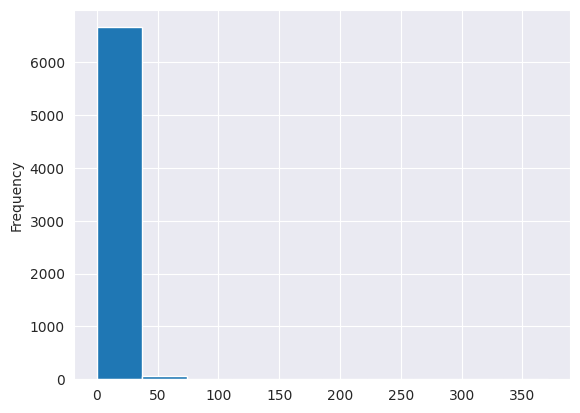

In [80]:
y_train.plot.hist()

<Axes: ylabel='Frequency'>

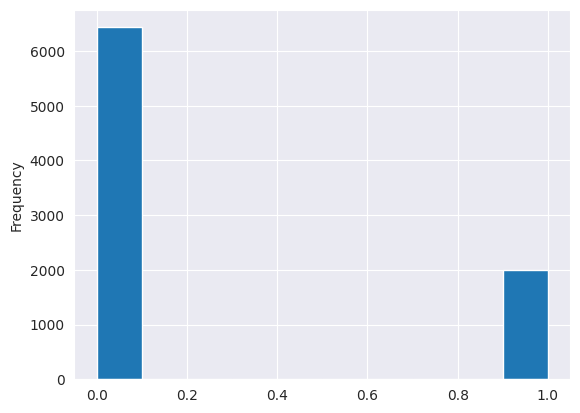

In [81]:
df['RainToday'].plot.hist()

In [82]:
df['Rainfall'].value_counts()

Rainfall
0.000000      5299
0.200000       406
2.805913       240
0.400000       177
0.600000       116
              ... 
61.200000        1
128.000000       1
90.000000        1
34.400000        1
40.000000        1
Name: count, Length: 251, dtype: int64

In [83]:
df['Rainfall'].nunique()

251

<h3 style="color:#553945">SCALING THE DATA</h3>

In [84]:
from sklearn.preprocessing import StandardScaler

In [85]:
scaler = StandardScaler()

In [86]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_train

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,0.016334,0.082828,0.707428,0.001600,-0.889264,-0.767878,-0.364214,-0.164854,0.046387,0.058780,-0.099542,0.001087,0.001108,0.018606,0.104024,-0.550610,0.759640,1.026151,-0.348517,-0.272848,-0.280000,-0.172609,-0.486282,-0.326421,-0.242383,-0.406551,-0.072249,-0.419106,-0.244435,-0.224355,-0.190905,-0.499768,-0.206635,-0.207414,-0.161826,-0.21696,-0.273162,-0.246812,-0.269379,-0.227619,-0.269379,3.859563,-0.258444,-0.251847,-0.23333,-0.175773,-0.512258,-0.22399,-0.234741,5.405943,-0.28429,-0.218455,-0.251847,-0.212804,-0.239972,-0.303654,-0.226535,-0.244435,-0.264917,-0.227979,-0.242383,-0.255162,-0.265558,-0.213184,-0.19422,-0.244435,-0.308582,-0.392820,-0.278456,-0.213944,-0.250846,-0.243069,-0.24715,3.694885
1,2.020455,1.212729,-0.728696,-1.568277,0.425232,0.315491,1.182508,0.849159,1.031185,-1.610022,-1.833126,1.000022,1.080329,1.920102,1.418412,1.816169,-0.044629,-1.007615,-0.348517,-0.272848,-0.280000,5.793453,-0.486282,-0.326421,-0.242383,-0.406551,-0.072249,-0.419106,-0.244435,-0.224355,-0.190905,-0.499768,-0.206635,-0.207414,-0.161826,-0.21696,-0.273162,-0.246812,-0.269379,-0.227619,-0.269379,3.859563,-0.258444,-0.251847,-0.23333,-0.175773,-0.512258,-0.22399,-0.234741,-0.184982,-0.28429,-0.218455,-0.251847,-0.212804,-0.239972,-0.303654,4.414331,-0.244435,-0.264917,-0.227979,-0.242383,-0.255162,-0.265558,-0.213184,-0.19422,-0.244435,-0.308582,-0.392820,-0.278456,-0.213944,-0.250846,4.114065,-0.24715,-0.270644
2,-0.807791,-0.113676,0.191366,0.001600,-0.000192,-0.964854,-1.498477,-1.357809,-0.664856,0.001601,0.002559,-1.463059,-1.513104,0.144177,-0.165594,-0.550610,0.357506,0.735613,-0.348517,-0.272848,-0.280000,-0.172609,-0.486282,3.063529,-0.242383,-0.406551,-0.072249,-0.419106,-0.244435,-0.224355,-0.190905,2.000928,-0.206635,-0.207414,-0.161826,-0.21696,-0.273162,-0.246812,-0.269379,-0.227619,-0.269379,-0.259097,-0.258444,-0.251847,-0.23333,-0.175773,-0.512258,-0.22399,-0.234741,-0.184982,-0.28429,-0.218455,-0.251847,-0.212804,-0.239972,3.293227,-0.226535,-0.244435,-0.264917,-0.227979,-0.242383,-0.255162,-0.265558,-0.213184,-0.19422,-0.244435,-0.308582,2.545698,-0.278456,-0.213944,-0.250846,-0.243069,-0.24715,-0.270644
3,-1.032553,-1.276327,-2.227088,-1.320338,-0.085961,0.807931,0.357590,0.371977,0.429364,0.646835,0.879612,0.178995,1.080329,-1.542056,-1.479983,1.816169,-0.848898,-0.136001,-0.348517,-0.272848,-0.280000,-0.172609,2.056419,-0.326421,-0.242383,-0.406551,-0.072249,-0.419106,-0.244435,-0.224355,-0.190905,-0.499768,-0.206635,-0.207414,-0.161826,-0.21696,-0.273162,-0.246812,-0.269379,-0.227619,-0.269379,-0.259097,-0.258444,3.970664,-0.23333,-0.175773,-0.512258,-0.22399,-0.234741,-0.184982,-0.28429,-0.218455,-0.251847,-0.212804,-0.239972,-0.303654,4.414331,-0.244435,-0.264917,-0.227979,-0.242383,-0.255162,-0.265558,-0.213184,-0.19422,-0.244435,-0.308582,-0.392820,-0.278456,-0.213944,-0.250846,4.114065,-0.24715,-0.270644
4,0.596967,-0.130051,0.765126,1.017366,-0.378071,-0.078461,0.0482

In [87]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
X_test

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,0.559507,0.213831,0.191366,0.001600,-0.085961,-0.275437,-1.189132,-1.178866,-0.227168,-1.180901,-1.415781,0.001087,0.001108,0.467072,0.356791,-0.550610,0.759640,1.316689,-0.348517,-0.272848,-0.28,-0.172609,-0.486282,-0.326421,-0.242383,-0.406551,-0.072249,-0.419106,-0.244435,-0.224355,-0.190905,-0.499768,-0.206635,-0.207414,-0.161826,-0.216960,-0.273162,-0.246812,-0.269379,-0.227619,-0.269379,-0.259097,-0.258444,3.970664,4.285769,-0.175773,-0.512258,-0.22399,-0.234741,-0.184982,-0.28429,-0.218455,-0.251847,-0.212804,-0.239972,-0.303654,-0.226535,-0.244435,-0.264917,-0.227979,-0.242383,-0.255162,-0.265558,-0.213184,-0.19422,-0.244435,-0.308582,-0.39282,-0.278456,-0.213944,-0.250846,-0.243069,4.046126,-0.270644
1,-1.912868,-0.965195,0.049948,0.001600,-0.378071,0.807931,-0.776673,-0.701684,-0.938411,1.155422,0.863561,0.001087,0.001108,-1.111528,-0.721682,-0.550610,1.563910,0.445075,-0.348517,-0.272848,-0.28,-0.172609,-0.486282,-0.326421,-0.242383,-0.406551,-0.072249,2.386032,-0.244435,-0.224355,-0.190905,-0.499768,-0.206635,-0.207414,-0.161826,4.609146,-0.273162,-0.246812,-0.269379,-0.227619,-0.269379,-0.259097,-0.258444,-0.251847,-0.233330,-0.175773,-0.512258,-0.22399,-0.234741,-0.184982,-0.28429,-0.218455,-0.251847,-0.212804,-0.239972,-0.303654,-0.226535,4.091069,-0.264917,-0.227979,-0.242383,-0.255162,-0.265558,-0.213184,-0.19422,4.091069,-0.308582,-0.39282,-0.278456,-0.213944,-0.250846,-0.243069,-0.247150,-0.270644
2,0.353476,0.246582,0.191366,0.001600,0.206150,-0.964854,0.151360,0.491272,-0.117746,0.001601,0.002559,0.001087,0.001108,0.341502,0.104024,-0.550610,1.161775,-1.007615,-0.348517,-0.272848,-0.28,-0.172609,-0.486282,-0.326421,4.125699,-0.406551,-0.072249,-0.419106,-0.244435,-0.224355,-0.190905,-0.499768,-0.206635,-0.207414,-0.161826,-0.216960,-0.273162,4.051669,-0.269379,-0.227619,-0.269379,-0.259097,-0.258444,-0.251847,-0.233330,-0.175773,-0.512258,-0.22399,-0.234741,-0.184982,-0.28429,4.577597,-0.251847,-0.212804,-0.239972,-0.303654,-0.226535,-0.244435,-0.264917,-0.227979,-0.242383,-0.255162,-0.265558,-0.213184,-0.19422,-0.244435,-0.308582,-0.39282,3.591226,-0.213944,-0.250846,-0.243069,-0.247150,-0.270644
3,-0.751601,-0.211928,0.191366,0.001600,0.060094,0.512467,0.151360,-0.343797,-1.157255,-0.116046,0.173337,0.589508,-0.648626,-0.896265,-0.249850,-0.550610,-1.251032,1.607227,2.869299,-0.272848,-0.28,-0.172609,-0.486282,-0.326421,-0.242383,-0.406551,-0.072249,-0.419106,-0.244435,-0.224355,-0.190905,-0.499768,-0.206635,-0.207414,-0.161826,-0.216960,-0.273162,-0.246812,-0.269379,-0.227619,3.712237,-0.259097,-0.258444,-0.251847,-0.233330,-0.175773,-0.512258,-0.22399,-0.234741,-0.184982,-0.28429,-0.218455,-0.251847,-0.212804,-0.239972,-0.303654,-0.226535,-0.244435,3.774767,-0.227979,-0.242383,-0.255162,-0.265558,-0.213184,-0.19422,-0.244435,-0.308582,-0.39282,-0.278456,-0.213944,3.986506,-0.243069,-0.247150,-0.270644
4,-0.245888,-0.588562,0.191366,0.001600,1.520646,0.610955,0.770049,0.37197

In [88]:
X_train.shape, X_test.shape

((6740, 74), (1685, 74))

<h2>MACHINE LEARNING MODEL 1 ⤵️</h2>
<h3 style="color:#39a7a7">This model predicts the rainfall in mm.</h3>

<h3 style="color:#495155">LINEAR REGRESSION MODEL</h3>

In [89]:
from sklearn.linear_model import LinearRegression

In [90]:
lr = LinearRegression()

In [91]:
lr.fit(X_train, y_train)

LinearRegression()

In [92]:
lr_pred=lr.predict(X_test)
lr_pred

array([-0.2765554 ,  0.17464048,  0.59871234, ..., -0.38965468,
       -0.90183316, 10.04332489])

In [93]:
y_test

6888     0.0
3119     0.0
2639     0.0
375      1.0
3648     0.0
        ... 
2667     0.0
3052    23.0
3042     0.6
560      0.0
6509     1.6
Name: Rainfall, Length: 1685, dtype: float64

In [94]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error, root_mean_squared_error

In [95]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, lr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, lr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, lr_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, lr_pred)}')
print()
print('Training r2 score is',lr.score(X_train, y_train))
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, lr_pred)}')

The mean absolute error (MAE) is 3.5643321812046396

The mean sqaured error (MSE) is 111.72702185269846

The root mean sqaured error (RMSE) is 10.570100370985058

The R2 SCORE is 0.24118359288570734

Training r2 score is 0.24923903147753912

The mean absolute percentage error is 3433737332456420.5


<Axes: xlabel='Rainfall'>

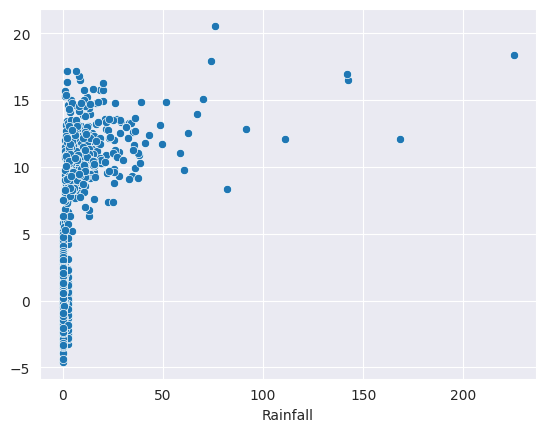

In [96]:
sns.scatterplot(x=y_test, y=lr_pred)

In [97]:
print('COEFFICIENTS : ',lr.coef_)
print()
print('INTERCEPT : ', lr.fit_intercept)

COEFFICIENTS :  [-0.09521592 -0.90174352  0.81587219 -0.63406944  0.91319622  0.2628919
 -0.28496852  0.80636869  0.70706391 -0.94808635  1.17842469  0.14727981
 -0.16901049 -0.60970046  2.05139559  3.96644492  0.05019352  0.23460129
 -0.05410416  0.33848581  0.74735201  0.12517711 -0.25563715 -0.31197985
  0.02471654  0.16454953 -0.00977559 -0.03129869 -0.09206935  0.0836267
  0.09984548  0.65595911  0.02021465  0.1462205   0.09417299  0.15553886
  0.03814866  0.15549358  0.0687636  -0.21046635 -0.07782975  0.01007783
 -0.09489303  0.10683938  0.02662536  0.3365679  -0.23714259  0.04001625
 -0.04432357 -0.09561071  0.018792    0.16323727  0.30198491  0.08411627
  0.26247302  0.21218129 -0.16445274  0.09143757  0.30534255  0.02493326
 -0.06470026 -0.05261247 -0.10716719 -0.1586772   0.0257569   0.10025393
  0.28829079  0.076023   -0.08258667  0.36107058  0.05960126  0.14130764
  0.11503604  0.11334091]

INTERCEPT :  True


<p style="font-size:140%;color:#ffb158">Our linear regression model is giving r2 score of 0.24 which is a really bad score. Let's see if we can improve it by training some more models.</p>

<h3 style="color:#79f4ff">DECISION TREE MODEL</h3>

In [98]:
from sklearn.tree import DecisionTreeRegressor

In [99]:
dtr = DecisionTreeRegressor()

In [100]:
dtr.fit(X_train, y_train)

DecisionTreeRegressor()

In [101]:
dtr_pred = dtr.predict(X_test)
dtr_pred

array([0. , 0. , 0. , ..., 0.6, 0. , 3. ])

In [102]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, dtr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, dtr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {np.sqrt(mean_squared_error(y_test, dtr_pred))}')
print()
print(f'The R2 SCORE is {r2_score(y_test, dtr_pred)}')
print()
print('Training r2 score is',dtr.score(X_train, y_train))
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, lr_pred)}')

The mean absolute error (MAE) is 2.744762123664734

The mean sqaured error (MSE) is 195.23525758889718

The root mean sqaured error (RMSE) is 13.972661077579216

The R2 SCORE is -0.3259792863803279

Training r2 score is 1.0

The mean absolute percentage error is 3433737332456420.5


<Axes: xlabel='Rainfall'>

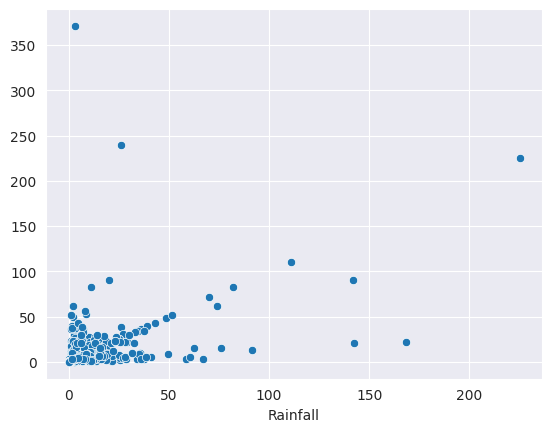

In [103]:
sns.scatterplot(x=y_test, y=dtr_pred)

<p style="font-size:140%;color:#ff3939">Our Decision Tree model is giving r2 score of -0.07  which is a really pathetic. Let's see if we can improve it by training some more models</p>

<h3>RANDOM FOREST REGRESSOR</h3>

In [104]:
from sklearn.ensemble import RandomForestRegressor

In [105]:
rfr = RandomForestRegressor()

In [106]:
rfr.fit(X_train, y_train)

RandomForestRegressor()

In [107]:
rfr_pred = rfr.predict(X_test)
rfr_pred

array([0.13823653, 0.        , 0.07005913, ..., 0.398     , 0.092     ,
       7.618     ])

In [108]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, rfr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, rfr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {np.sqrt(mean_squared_error(y_test, rfr_pred))}')
print()
print(f'The R2 SCORE is {r2_score(y_test, rfr_pred)}')
print()
print(f'Training r2 score is {rfr.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, rfr_pred)}')

The mean absolute error (MAE) is 2.140364180042743

The mean sqaured error (MSE) is 60.791989651627865

The root mean sqaured error (RMSE) is 7.796921806176323

The R2 SCORE is 0.5871190478021018

Training r2 score is 0.8951392823862399

The mean absolute percentage error is 254065956345410.0


<Axes: xlabel='Rainfall'>

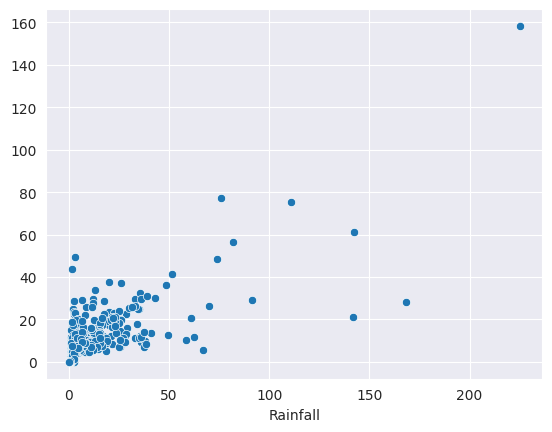

In [109]:
sns.scatterplot(x=y_test, y=rfr_pred)

<p style="font-size:140%;color:#ff3939">Our Random Tree model is giving r2 score of 0.59 which is a respectable score. Let's see if we can improve it by training some more models</p>

<h3>SVM MODEL</h3>

In [110]:
from sklearn.svm import SVR

In [111]:
svr = SVR()

In [112]:
svr.fit(X_train, y_train)

SVR()

In [113]:
svr_pred = svr.predict(X_test)
svr_pred

array([ 0.06577838, -0.01494892,  0.3391543 , ...,  0.37387863,
        0.02677436,  4.44671174])

In [114]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, svr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, svr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, svr_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, svr_pred)}')
print()
print(f'Training r2 score is {svr.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, svr_pred)}')

The mean absolute error (MAE) is 2.6547567932681457

The mean sqaured error (MSE) is 131.07229519380482

The root mean sqaured error (RMSE) is 11.448680936850534

The R2 SCORE is 0.10979630118204231

Training r2 score is 0.1473436954531544

The mean absolute percentage error is 355379110875558.1


<Axes: xlabel='Rainfall'>

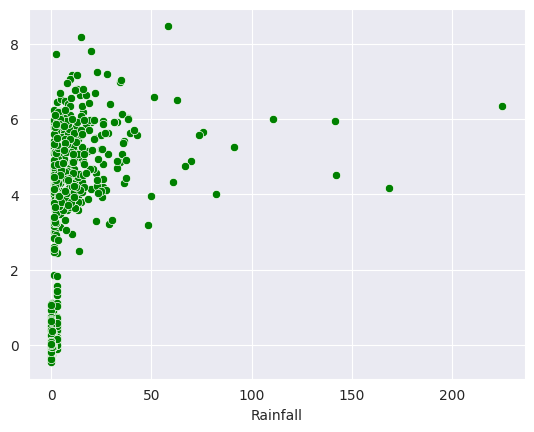

In [115]:
sns.scatterplot(x=y_test, y=svr_pred, color='green')

<h3>KNN MODEL</h3>

In [116]:
from sklearn.neighbors import KNeighborsRegressor

In [117]:
knn = KNeighborsRegressor()

In [118]:
knn.fit(X_train, y_train)

KNeighborsRegressor()

In [119]:
knn_pred = knn.predict(X_test)
knn_pred

array([1.44, 0.  , 0.16, ..., 0.12, 0.16, 4.  ])

In [120]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, knn_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, knn_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, knn_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, knn_pred)}')
print()
print(f'Training r2 score is {knn.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, knn_pred)}')

The mean absolute error (MAE) is 3.3068447492971327

The mean sqaured error (MSE) is 117.37040530719058

The root mean sqaured error (RMSE) is 10.833762287736914

The R2 SCORE is 0.20285542584164384

Training r2 score is 0.3915215089439795

The mean absolute percentage error is 2545582012402494.0


<Axes: xlabel='Rainfall'>

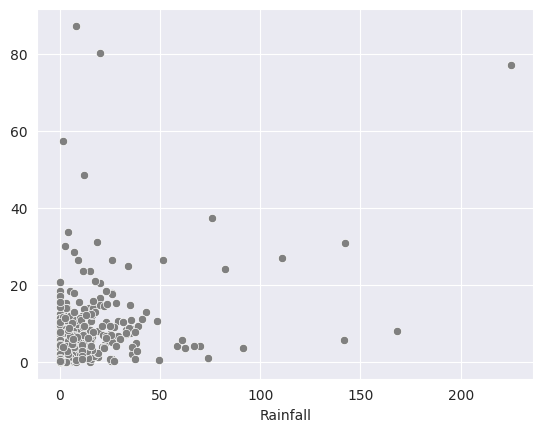

In [121]:
sns.scatterplot(x=y_test, y=knn_pred, color='gray')

<h3>GRADIENT BOOSTING MODEL</h3>

In [122]:
from sklearn.ensemble import GradientBoostingRegressor

In [123]:
gbr = GradientBoostingRegressor()

In [124]:
gbr.fit(X_train, y_train)

GradientBoostingRegressor()

In [125]:
gbr_pred = gbr.predict(X_test)

In [126]:
gbr_pred

array([ 0.36965439,  0.05129174,  0.23482643, ...,  1.34520059,
       -0.17820577,  8.39203173])

In [127]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, gbr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, gbr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, gbr_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, gbr_pred)}')
print()
print(f'Training r2 score is {gbr.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, gbr_pred)}')

The mean absolute error (MAE) is 2.5547819076169924

The mean sqaured error (MSE) is 70.29006996024496

The root mean sqaured error (RMSE) is 8.383917339778879

The R2 SCORE is 0.5226109363823777

Training r2 score is 0.6571439739875946

The mean absolute percentage error is 886117129662046.5


<Axes: xlabel='Rainfall'>

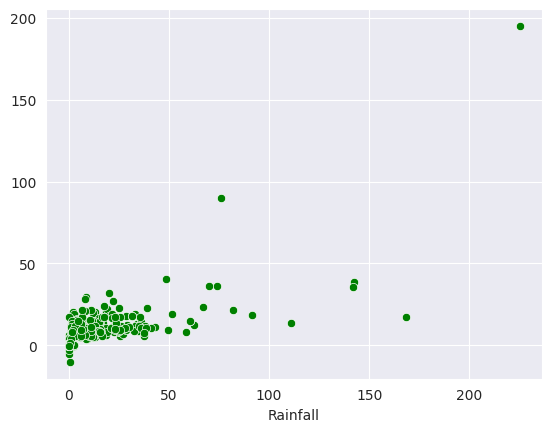

In [128]:
sns.scatterplot(x=y_test, y=gbr_pred, color='green')

<h3>XGBOOST</h3>

In [129]:
from xgboost import XGBRegressor

In [130]:
xgb = XGBRegressor()

In [131]:
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [132]:
xgb_pred = xgb.predict(X_test)
xgb_pred

array([ 0.3318727 , -0.05968428,  0.1876183 , ...,  0.4135529 ,
        0.23062152,  8.106442  ], dtype=float32)

In [133]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, xgb_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, xgb_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, xgb_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, xgb_pred)}')
print()
print(f'Training r2 score is {xgb.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, xgb_pred)}')

The mean absolute error (MAE) is 2.247598528112872

The mean sqaured error (MSE) is 71.16023782715322

The root mean sqaured error (RMSE) is 8.435652780144121

The R2 SCORE is 0.5167010173367936

Training r2 score is 0.989777033598917

The mean absolute percentage error is 920710323330805.2


<Axes: xlabel='Rainfall'>

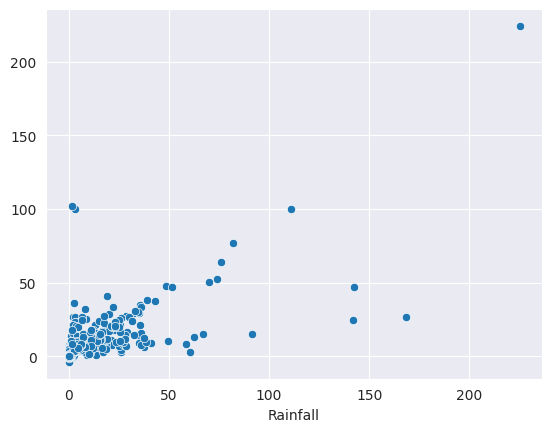

In [134]:
sns.scatterplot(x=y_test, y=xgb_pred)

<h2>CATBOOST</h2>

In [135]:
from catboost import CatBoostRegressor

In [136]:
cat = CatBoostRegressor(verbose=False)

In [137]:
cat.fit(X_train, y_train)

In [138]:
cat_pred = cat.predict(X_test)
cat_pred

array([ 0.20514474, -0.14759897,  0.14066663, ...,  0.5442488 ,
        0.33289368,  9.70636153])

In [139]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, cat_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, cat_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, cat_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, cat_pred)}')
print()
print(f'Training r2 score is {cat.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, cat_pred)}')

The mean absolute error (MAE) is 2.275486067036413

The mean sqaured error (MSE) is 51.64471914644058

The root mean sqaured error (RMSE) is 7.1864260342983135

The R2 SCORE is 0.6492445643024873

Training r2 score is 0.930147692312611

The mean absolute percentage error is 1072383898084018.0


<Axes: xlabel='Rainfall'>

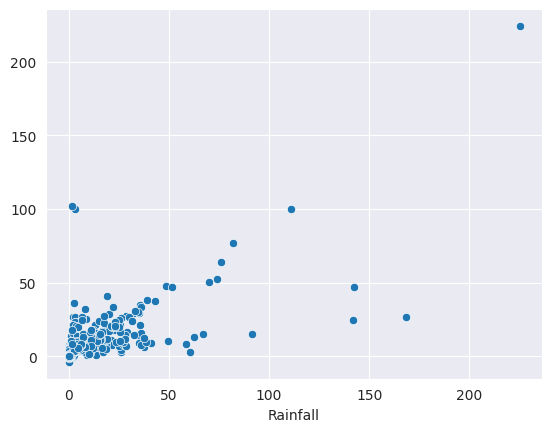

In [140]:
sns.scatterplot(x=y_test, y=xgb_pred)

<p style="font-size:140%;color:#f263ff">We tested multiple machine learning models to find out which is the best performing model and the results were quite shocking CATBOOST is the best model with an r2 score of 0.64 even better than Random Forest and xgboost. The runnerup is none other than Random Forest which came close and it gave an R2 score of 0.59 which is really good considering the situtaion. So, we will use this machine learning model for further training.</p>

In [141]:
model_names = ['Linear Regression', 'Decision Tree', 'Random Forest', 'SVM', 'KNN', 'Gradient Boosting', 'XGBOOST', 'CATBOOST']
models = [lr_pred, dtr_pred, rfr_pred, svr_pred, knn_pred, gbr_pred, xgb_pred, cat_pred]
r2scorelist = []
for x in models:
    print(r2_score(y_test, x))
    r2scorelist.append(r2_score(y_test, x))
print(r2scorelist)

0.24118359288570734
-0.3259792863803279
0.5871190478021018
0.10979630118204231
0.20285542584164384
0.5226109363823777
0.5167010173367936
0.6492445643024873
[0.24118359288570734, -0.3259792863803279, 0.5871190478021018, 0.10979630118204231, 0.20285542584164384, 0.5226109363823777, 0.5167010173367936, 0.6492445643024873]


In [142]:
data = pd.DataFrame({
    'Model': model_names,
    'R2 Score': r2scorelist
})

In [143]:
data = data.sort_values(by='R2 Score', ascending=False)

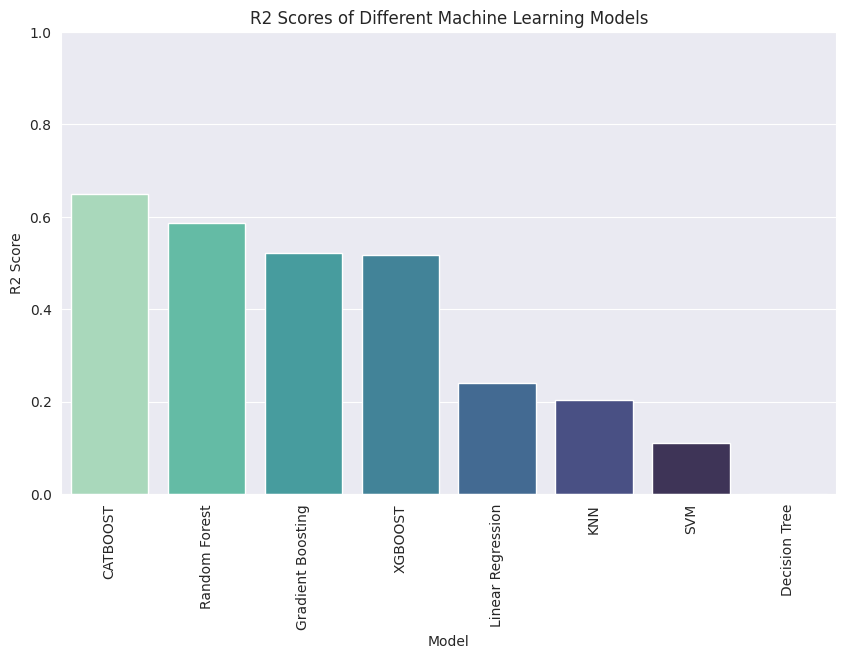

In [144]:
plt.figure(figsize=(10, 6))
sns.barplot(data=data, x='Model', y='R2 Score', palette='mako_r')
plt.title('R2 Scores of Different Machine Learning Models')
plt.xlabel('Model')
plt.ylabel('R2 Score')
plt.ylim(0, 1) 
plt.xticks(rotation=90)
plt.show()

<h3>CROSS VALIDATION</h3>

In [145]:
from sklearn.model_selection import cross_val_score

np.random.seed(10)
def r2(model, X_train,y_train):
    r2 = cross_val_score(model, X ,y , scoring='r2', cv=5)
    return(r2)


models = [LinearRegression(),
          DecisionTreeRegressor(),
          RandomForestRegressor(),
          SVR(),
          KNeighborsRegressor(),
          GradientBoostingRegressor(),
          XGBRegressor(),
          CatBoostRegressor(verbose=False)]
            


names = ['LR', 'DTR', 'RFR', 'SVR', 'KNN', 'GBR', 'XGB', 'CAT']

for model,name in zip(models,names):
    score = r2(model,X_train,y_train)
    print(name, score)
    print("{}    : {:.6f}, {:4f}".format(name,score.mean(),score.std()))
    print('**************************************************************')

LR [0.18209706 0.20497303 0.27337508 0.20930785 0.32979749]
LR    : 0.239910, 0.054220
**************************************************************
DTR [-0.04727798  0.44194768  0.68909118  0.38365093 -0.00939865]
DTR    : 0.291603, 0.280897
**************************************************************
RFR [0.1879254  0.51874407 0.74855056 0.44914399 0.4573154 ]
RFR    : 0.472336, 0.178942
**************************************************************
SVR [-0.04976483 -0.06401736 -0.07926564 -0.09102518 -0.05967634]
SVR    : -0.068750, 0.014642
**************************************************************
KNN [0.14206967 0.20224045 0.19875026 0.17686042 0.1519099 ]
KNN    : 0.174366, 0.024187
**************************************************************
GBR [0.17086475 0.4456234  0.56379949 0.36860016 0.45642274]
GBR    : 0.401062, 0.130827
**************************************************************
XGB [0.10616415 0.52085308 0.75586502 0.42323115 0.50001351]
XGB    : 0.461225,

<h3>HYPERPARAMTER TUNING</h3>

In [146]:
from sklearn.model_selection import RandomizedSearchCV

In [147]:
param_grid = {
    'iterations': [100, 200, 500],  # Number of boosting iterations
    'learning_rate': [0.01, 0.05, 0.1, 0.2],  # Learning rate
    'border_count': [32, 50, 100],  # Number of splits for numerical features
    'random_strength': [1, 2, 5, 10],  # Random strength for feature sampling
    'depth': [4, 6, 8, 10],  # Depth of the tree
    'l2_leaf_reg': [1, 3, 5, 7],  # L2 regularization term on weights
    'bagging_temperature': [0.0, 0.5, 1.0],  # Controls overfitting by randomizing the weights of trees
    'random_strength': [1, 2, 5, 10],  # Random strength for feature sampling
    'rsm': [0.8, 1.0],  # Random subspace method for feature sampling
}

In [148]:
randomizesearchcv = RandomizedSearchCV(CatBoostRegressor(verbose=False), param_grid,scoring='r2', n_jobs=-1,cv=5, verbose=4)

In [149]:
randomizesearchcv.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostRegressor object at 0x756a49792b10>,
                   n_jobs=-1,
                   param_distributions={'bagging_temperature': [0.0, 0.5, 1.0],
                                        'border_count': [32, 50, 100],
                                        'depth': [4, 6, 8, 10],
                                        'iterations': [100, 200, 500],
                                        'l2_leaf_reg': [1, 3, 5, 7],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.2],
                                        'random_strength': [1, 2, 5, 10],
                                        'rsm': [0.8, 1.0]},
                   scoring='r2', verbose=4)

In [150]:
randomizesearchcv.best_score_

0.3365908993995447

In [151]:
randomizesearchcv.best_params_

{'rsm': 0.8,
 'random_strength': 10,
 'learning_rate': 0.1,
 'l2_leaf_reg': 7,
 'iterations': 100,
 'depth': 10,
 'border_count': 32,
 'bagging_temperature': 0.5}

<p style="font-size:140%;color:#b5761e">Even after hyperparameter tuning and cross validation,we cannot improve the r2 score by much, so we will stop here and the final score is 0.64. So, we will now save the model using joblib.</p>

<h2>SAVING THE MODEL</h2>

In [152]:
import joblib

In [153]:
joblib.dump(cat, 'Rainfall_Regression_Prediction.pkl')

['Rainfall_Regression_Prediction.pkl']

<h2 style="color:red">Now, we will build our second model to predict whether it will rain or not tomorrow.</h2>

In [154]:
X = df.drop(['Rainfall', 'RainTomorrow'], axis=1)
y = df['RainTomorrow']

In [155]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [156]:
y_train.value_counts()

RainTomorrow
0    5163
1    1577
Name: count, dtype: int64

In [157]:
y_test.value_counts()

RainTomorrow
0    1271
1     414
Name: count, dtype: int64

In [158]:
#Its an imbalanced dataset. So, we will use SMOTE 

In [159]:
from imblearn.over_sampling import SMOTE

In [160]:
smote = SMOTE()

In [161]:
X_train, y_train = smote.fit_resample(X_train, y_train)

In [162]:
scaler=StandardScaler()

In [163]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_train

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,-0.035373,0.183512,0.798252,0.197202,-0.969213,-0.816718,-0.390148,-0.337335,-0.208773,0.159811,-0.016781,-0.182944,-0.218498,0.038264,0.225729,-0.584582,0.835857,1.111238,-0.302371,-0.249034,-0.247715,-0.146857,-0.435309,-0.306926,-0.214697,-0.356953,-0.058318,-0.377169,-0.219829,-0.183958,-0.156545,-0.446278,-0.170891,-0.172683,-0.136177,-0.180555,-0.230513,-0.205909,-0.224866,-0.191423,-0.227703,4.610240,-0.217642,-0.213955,-0.189238,-0.144779,-0.452349,-0.186197,-0.201266,6.552894,-0.236965,-0.181126,-0.210968,-0.174164,-0.199435,-0.262783,-0.189512,-0.208451,-0.218859,-0.188688,-0.19996,-0.219345,-0.218129,-0.177675,-0.17059,-0.202823,-0.261939,-0.344240,-0.231443,-0.18283,-0.211468,-0.203082,-0.203082,4.369153
1,2.017417,1.342547,-0.707445,-1.362885,0.301098,0.275003,1.132467,0.681839,0.734156,-1.522874,-1.764318,0.864046,0.905533,1.986935,1.567440,1.710624,0.013851,-1.017864,-0.302371,-0.249034,-0.247715,6.809330,-0.435309,-0.306926,-0.214697,-0.356953,-0.058318,-0.377169,-0.219829,-0.183958,-0.156545,-0.446278,-0.170891,-0.172683,-0.136177,-0.180555,-0.230513,-0.205909,-0.224866,-0.191423,-0.227703,4.610240,-0.217642,-0.213955,-0.189238,-0.144779,-0.452349,-0.186197,-0.201266,-0.152604,-0.236965,-0.181126,-0.210968,-0.174164,-0.199435,-0.262783,5.276701,-0.208451,-0.218859,-0.188688,-0.19996,-0.219345,-0.218129,-0.177675,-0.17059,-0.202823,-0.261939,-0.344240,-0.231443,-0.18283,-0.211468,4.924119,-0.203082,-0.228877
2,-0.879511,-0.018059,0.257189,0.197202,-0.110027,-1.015213,-1.506733,-1.536362,-0.889777,0.102156,0.086142,-1.717526,-1.795581,0.166950,-0.049493,-0.584582,0.424854,0.807081,-0.302371,-0.249034,-0.247715,-0.146857,-0.435309,3.258113,-0.214697,-0.356953,-0.058318,-0.377169,-0.219829,-0.183958,-0.156545,2.240757,-0.170891,-0.172683,-0.136177,-0.180555,-0.230513,-0.205909,-0.224866,-0.191423,-0.227703,-0.216908,-0.217642,-0.213955,-0.189238,-0.144779,-0.452349,-0.186197,-0.201266,-0.152604,-0.236965,-0.181126,-0.210968,-0.174164,-0.199435,3.805425,-0.189512,-0.208451,-0.218859,-0.188688,-0.19996,-0.219345,-0.218129,-0.177675,-0.17059,-0.202823,-0.261939,2.904954,-0.231443,-0.18283,-0.211468,-0.203082,-0.203082,-0.228877
3,-1.109731,-1.210689,-2.278428,-1.116493,-0.192912,0.771240,0.320406,0.202228,0.157922,0.752757,0.970254,0.003522,0.905533,-1.561117,-1.391204,1.710624,-0.808155,-0.105392,-0.302371,-0.249034,-0.247715,-0.146857,2.297216,-0.306926,-0.214697,-0.356953,-0.058318,-0.377169,-0.219829,-0.183958,-0.156545,-0.446278,-0.170891,-0.172683,-0.136177,-0.180555,-0.230513,-0.205909,-0.224866,-0.191423,-0.227703,-0.216908,-0.217642,4.673878,-0.189238,-0.144779,-0.452349,-0.186197,-0.201266,-0.152604,-0.236965,-0.181126,-0.210968,-0.174164,-0.199435,-0.262783,5.276701,-0.208451,-0.218859,-0.188688,-0.19996,-0.219345,-0.218129,-0.177675,-0.17059,-0.202823,-0.261939,-0.344240,-0.231443,-0.18283,-0.211468,4.924119,-0.203082,-0.228877
4,0.559360,-0.034857,0.858745,1.206635,-0.475204,-

In [164]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
X_test

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,0.520991,0.317893,0.257189,0.197202,-0.192912,-0.320481,-1.202210,-1.356508,-0.470698,-1.090184,-1.343615,-0.182944,-0.218498,0.497856,0.483751,-0.584582,0.835857,1.415396,-0.302371,-0.249034,-0.247715,-0.146857,-0.435309,-0.306926,-0.214697,-0.356953,-0.058318,-0.377169,-0.219829,-0.183958,-0.156545,-0.446278,-0.170891,-0.172683,-0.136177,-0.180555,-0.230513,-0.205909,-0.224866,-0.191423,-0.227703,-0.216908,-0.217642,4.673878,5.284351,-0.144779,-0.452349,-0.186197,-0.201266,-0.152604,-0.236965,-0.181126,-0.210968,-0.174164,-0.199435,-0.262783,-0.189512,-0.208451,-0.218859,-0.188688,-0.199960,-0.219345,-0.218129,-0.177675,-0.17059,-0.202823,-0.261939,-0.34424,-0.231443,-0.18283,-0.211468,-0.203082,4.924119,-0.228877
1,-2.011424,-0.891534,0.108920,0.197202,-0.475204,0.771240,-0.796179,-0.876897,-1.151702,1.265576,0.954073,-0.182944,-0.218498,-1.119908,-0.617140,-0.584582,1.657863,0.502923,-0.302371,-0.249034,-0.247715,-0.146857,-0.435309,-0.306926,-0.214697,-0.356953,-0.058318,2.651330,-0.219829,-0.183958,-0.156545,-0.446278,-0.170891,-0.172683,-0.136177,5.538488,-0.230513,-0.205909,-0.224866,-0.191423,-0.227703,-0.216908,-0.217642,-0.213955,-0.189238,-0.144779,-0.452349,-0.186197,-0.201266,-0.152604,-0.236965,-0.181126,-0.210968,-0.174164,-0.199435,-0.262783,-0.189512,4.797286,-0.218859,-0.188688,-0.199960,-0.219345,-0.218129,-0.177675,-0.17059,4.930398,-0.261939,-0.34424,-0.231443,-0.18283,-0.211468,-0.203082,-0.203082,-0.228877
2,0.309956,0.351488,0.257189,0.197202,0.089379,-1.015213,0.117390,0.322131,-0.365928,0.102156,0.086142,-0.182944,-0.218498,0.369170,0.225729,-0.584582,1.246860,-1.017864,-0.302371,-0.249034,-0.247715,-0.146857,-0.435309,-0.306926,4.657736,-0.356953,-0.058318,-0.377169,-0.219829,-0.183958,-0.156545,-0.446278,-0.170891,-0.172683,-0.136177,-0.180555,-0.230513,4.856513,-0.224866,-0.191423,-0.227703,-0.216908,-0.217642,-0.213955,-0.189238,-0.144779,-0.452349,-0.186197,-0.201266,-0.152604,-0.236965,5.521024,-0.210968,-0.174164,-0.199435,-0.262783,-0.189512,-0.208451,-0.218859,-0.188688,-0.199960,-0.219345,-0.218129,-0.177675,-0.17059,-0.202823,-0.261939,-0.34424,4.320714,-0.18283,-0.211468,-0.203082,-0.203082,-0.228877
3,-0.821956,-0.118845,0.257189,0.197202,-0.051767,0.473498,0.117390,-0.517189,-1.361242,-0.016470,0.258294,0.433784,-0.895210,-0.899304,-0.135501,-0.584582,-1.219158,1.719553,3.307200,-0.249034,-0.247715,-0.146857,-0.435309,-0.306926,-0.214697,-0.356953,-0.058318,-0.377169,-0.219829,-0.183958,-0.156545,-0.446278,-0.170891,-0.172683,-0.136177,-0.180555,-0.230513,-0.205909,-0.224866,-0.191423,4.391678,-0.216908,-0.217642,-0.213955,-0.189238,-0.144779,-0.452349,-0.186197,-0.201266,-0.152604,-0.236965,-0.181126,-0.210968,-0.174164,-0.199435,-0.262783,-0.189512,-0.208451,4.569149,-0.188688,-0.199960,-0.219345,-0.218129,-0.177675,-0.17059,-0.202823,-0.261939,-0.34424,-0.231443,-0.18283,4.728847,-0.203082,-0.203082,-0.228877
4,-0.303963,-0.505189,0.257189,0.197202,1.35969

In [165]:
X_train.shape

(10326, 74)

In [166]:
X_test.shape

(1685, 74)

<p style="font-size:140%;color:#00557f">We have now started building the Binary Classification model to predict whether it will rain tomorrow or not. For that, we have used oversampling technique SMOTE and scaled the data using StandardScaler.</p>

<h2>LOGISTIC REGRESSION</h2>

In [167]:
from sklearn.linear_model import LogisticRegression

In [168]:
log_model = LogisticRegression()

In [169]:
log_model.fit(X_train, y_train)

LogisticRegression()

In [170]:
log_pred = log_model.predict(X_test)
log_pred

array([0, 0, 0, ..., 0, 0, 0])

In [171]:
y_test

6888    1
3119    0
2639    0
375     0
3648    0
       ..
2667    1
3052    0
3042    0
560     0
6509    0
Name: RainTomorrow, Length: 1685, dtype: int64

In [172]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, roc_auc_score

In [173]:
print('ACCURACY SCORE : ', accuracy_score(y_test, log_pred))
print("Training accuracy :", log_model.score(X_train, y_train))
print("Test accuracy :", log_model.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, log_pred))
print('\n\n \n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, log_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, log_pred))


ACCURACY SCORE :  0.8267062314540059
Training accuracy : 0.8642262250629479
Test accuracy : 0.8267062314540059
ROC AUC SCORE :  0.743434930842997


 
-------------------Confusion Matrix--------------

[[1153  118]
 [ 174  240]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           0       0.87      0.91      0.89      1271
           1       0.67      0.58      0.62       414

    accuracy                           0.83      1685
   macro avg       0.77      0.74      0.75      1685
weighted avg       0.82      0.83      0.82      1685



In [174]:
from sklearn.model_selection import cross_val_score
log_score=cross_val_score(log_model, X, y, cv=5, scoring='accuracy')
print(log_score)
print()
print("cross validation score for Logistic Regression :", np.mean(log_score))

[0.8504451  0.78872404 0.77388724 0.8189911  0.85578635]

cross validation score for Logistic Regression : 0.8175667655786351


<Axes: >

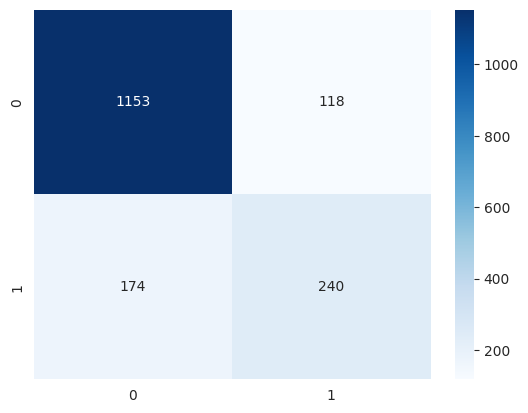

In [175]:
sns.heatmap(confusion_matrix(y_test, log_pred),fmt='0.9g',annot=True,cmap='Blues',)

In [176]:
y_pred_proba = log_model.predict_proba(X_test)[:, 1]
y_pred_proba

array([0.18171123, 0.03156316, 0.18826565, ..., 0.12856325, 0.16206435,
       0.36602883])

In [177]:
from sklearn.metrics import auc

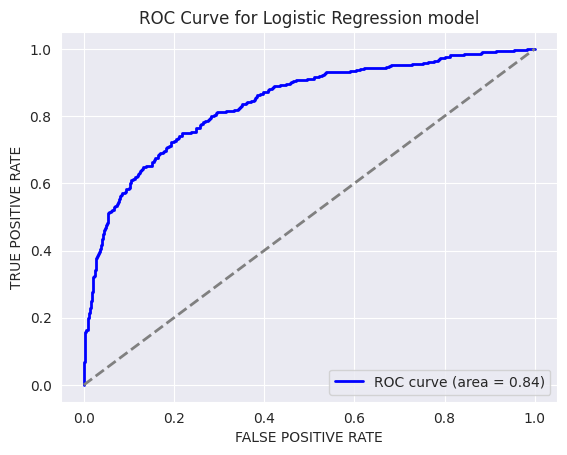

In [178]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for Logistic Regression model')
plt.legend(loc="lower right")

<p style="font-size:120%;color:#ff1a38">Logistic Regression model is giving good results with 83% accuracy and 0.74 roc auc score which means our model is learning about both the classes equally. There is also no overfitting and underfitting issue as our model is giving training accuracy of 86%.</p>

<h2>DECISION TREE CLASSIFIER</h2>

In [179]:
from sklearn.tree import DecisionTreeClassifier

In [180]:
dtc = DecisionTreeClassifier()

In [181]:
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

In [182]:
dtc_pred=dtc.predict(X_test)
dtc_pred

array([0, 0, 0, ..., 0, 0, 1])

In [183]:
print('ACCURACY SCORE : ', accuracy_score(y_test, dtc_pred))
print("Training accuracy :", dtc.score(X_train, y_train))
print("Test accuracy :", dtc.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, dtc_pred))
print('\n\n \n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, dtc_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, dtc_pred))


ACCURACY SCORE :  0.8545994065281899
Training accuracy : 0.9999031570792175
Test accuracy : 0.8545994065281899
ROC AUC SCORE :  0.7977552005534081


 
-------------------Confusion Matrix--------------

[[1156  115]
 [ 130  284]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           0       0.90      0.91      0.90      1271
           1       0.71      0.69      0.70       414

    accuracy                           0.85      1685
   macro avg       0.81      0.80      0.80      1685
weighted avg       0.85      0.85      0.85      1685



In [184]:
dtc_score=cross_val_score(dtc,X,y,cv=5,scoring='accuracy')
print(dtc_score)
print()
print("cross validation score for Decision Tree :",np.mean(dtc_score))

[0.73115727 0.83738872 0.85875371 0.61721068 0.78991098]

cross validation score for Decision Tree : 0.7668842729970327


<Axes: >

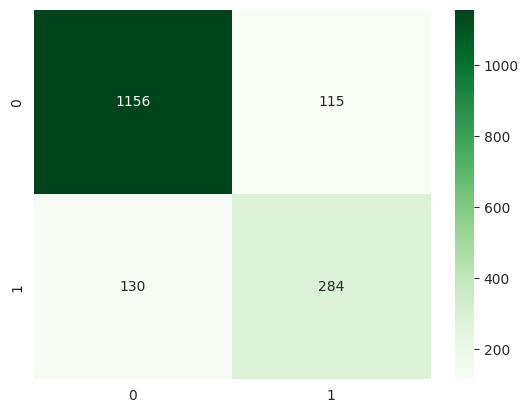

In [185]:
sns.heatmap(confusion_matrix(y_test, dtc_pred),fmt='0.9g',annot=True,cmap='Greens')

In [186]:
y_pred_proba = dtc.predict_proba(X_test)[:, 1]
y_pred_proba

array([0., 0., 0., ..., 0., 0., 1.])

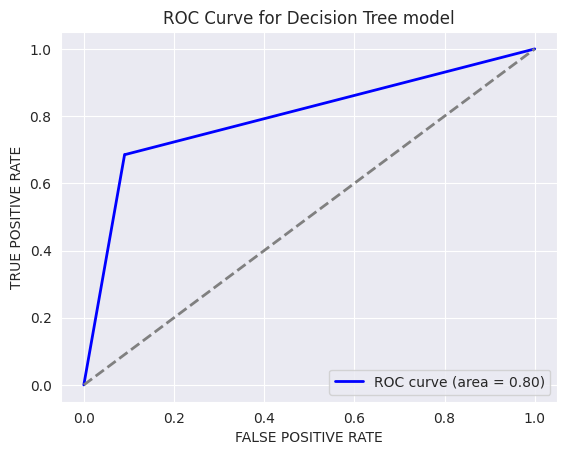

In [187]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for Decision Tree model')
plt.legend(loc="lower right")

<p style="font-size:120%;color:#3826ff">Decision Tree is also a good model slightly more accuracte than Logistic Regression as it gives 84% accuracy and 0.79 roc auc score.</p>

<h2>RANDOM FOREST CLASSIFIER</h2>

In [188]:
from sklearn.ensemble import RandomForestClassifier

In [189]:
rfc = RandomForestClassifier()

In [190]:
rfc.fit(X_train, y_train)

RandomForestClassifier()

In [191]:
rfc_pred = rfc.predict(X_test)
rfc_pred

array([0, 0, 0, ..., 0, 0, 0])

In [192]:
print('ACCURACY SCORE : ', accuracy_score(y_test, rfc_pred))
print("Training accuracy :", rfc.score(X_train, y_train))
print("Test accuracy :", rfc.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, rfc_pred))
print('\n\n \n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, rfc_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, rfc_pred))


ACCURACY SCORE :  0.8985163204747775
Training accuracy : 0.9999031570792175
Test accuracy : 0.8985163204747775
ROC AUC SCORE :  0.8464102593340099


 
-------------------Confusion Matrix--------------

[[1206   65]
 [ 106  308]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           0       0.92      0.95      0.93      1271
           1       0.83      0.74      0.78       414

    accuracy                           0.90      1685
   macro avg       0.87      0.85      0.86      1685
weighted avg       0.90      0.90      0.90      1685



In [193]:
rfc_score=cross_val_score(rfc, X, y, cv=5, scoring='accuracy')
print(rfc_score)
print()
print("cross validation score for Random Forest :", np.mean(rfc_score))

[0.84688427 0.85163205 0.87418398 0.61958457 0.84035608]

cross validation score for Random Forest : 0.8065281899109793


<Axes: >

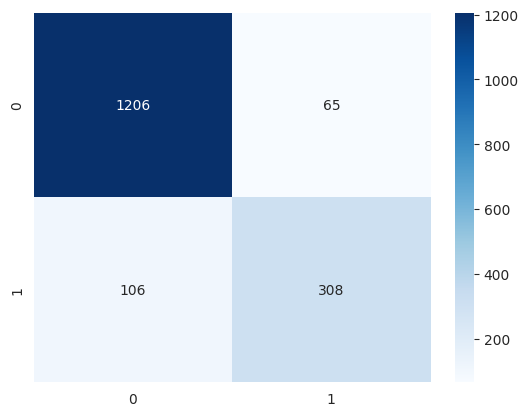

In [194]:
sns.heatmap(confusion_matrix(y_test, rfc_pred),fmt='0.9g', annot=True,cmap='Blues')

In [195]:
y_pred_proba = rfc.predict_proba(X_test)[:, 1]
y_pred_proba

array([0.24, 0.03, 0.32, ..., 0.04, 0.16, 0.28])

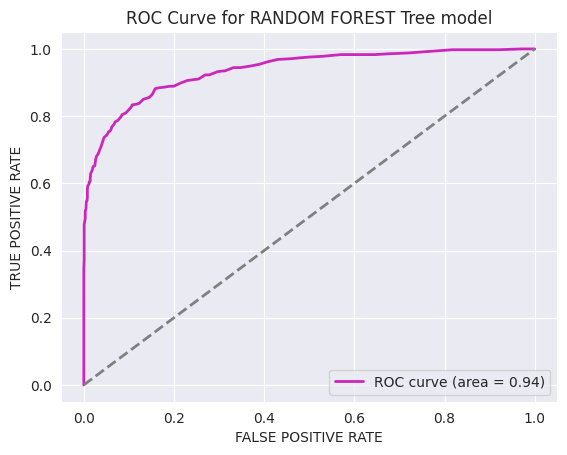

In [196]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#cb28bb', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for RANDOM FOREST Tree model')
plt.legend(loc="lower right")

<p style="color:#8f8641;font-size:140%">Random Forest Classifier gives an impressive accuracy of 90% or 0.90 and roc_auc_score of 0.84 which is fantastic. Also, there is zero issue of overfitting and underfitting as training accuracy is 99% and our model is also learning about both the classes very well beacuse we can see the roc curve above and area is 0.93 which is fabulous.</p>

<h2>SUPPORT VECTOR MACHINE CLASSIFIER</h2>

In [197]:
from sklearn.svm import SVC

In [198]:
svc = SVC(probability=True)

In [199]:
svc.fit(X_train, y_train)

SVC(probability=True)

In [200]:
svc_pred = svc.predict(X_test)
svc_pred

array([0, 0, 0, ..., 0, 0, 0])

In [201]:
print('ACCURACY SCORE : ', accuracy_score(y_test, svc_pred))
print("Training accuracy: ",svc.score(X_train,y_train))
print("Test accuracy : ",svc.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, svc_pred))
print('\n\n \n---------Confusion Matrix--------------')
print(confusion_matrix(y_test,svc_pred))
print('\n\n \n---------Classification Report--------------')
print(classification_report(y_test,svc_pred))

ACCURACY SCORE :  0.8682492581602373
Training accuracy:  0.942572147975983
Test accuracy :  0.8682492581602373
ROC AUC SCORE :  0.7880734101871173


 
---------Confusion Matrix--------------
[[1202   69]
 [ 153  261]]


 
---------Classification Report--------------
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1271
           1       0.79      0.63      0.70       414

    accuracy                           0.87      1685
   macro avg       0.84      0.79      0.81      1685
weighted avg       0.86      0.87      0.86      1685



In [202]:
svc_score=cross_val_score(svc, X, y, cv=5, scoring='accuracy')
print(svc_score)
print()
print("cross validation score for SVM :", np.mean(svc_score))

[0.76379822 0.76379822 0.76379822 0.76379822 0.76320475]

cross validation score for SVM : 0.7636795252225519


<Axes: >

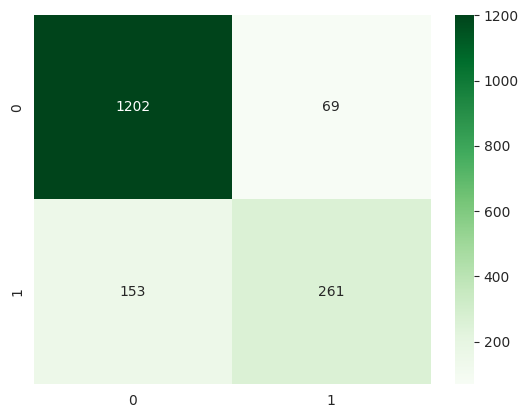

In [203]:
sns.heatmap(confusion_matrix(y_test, svc_pred),fmt='0.9g', annot=True,cmap='Greens')

In [204]:
y_pred_proba = svc.predict_proba(X_test)[:,1]
y_pred_proba

array([0.1008356 , 0.05836917, 0.30746313, ..., 0.0397305 , 0.03279278,
       0.14345148])

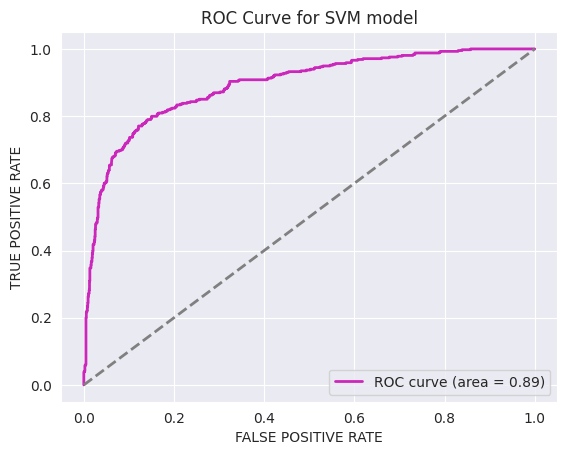

In [205]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#cb28bb', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for SVM model')
plt.legend(loc="lower right")

<p style="color:#42b9d9;font-size:140%">We see that SVM is also a good model but not better than Random Forest </p>

<h2>Gradient Boosting Classifier</h2>

In [206]:
from sklearn.ensemble import GradientBoostingClassifier

In [207]:
gbc = GradientBoostingClassifier()

In [208]:
gbc.fit(X_train, y_train)

GradientBoostingClassifier()

In [209]:
gbc_pred = gbc.predict(X_test)
gbc_pred

array([0, 0, 0, ..., 0, 0, 0])

In [210]:
print('ACCURACY SCORE : ', accuracy_score(y_test, gbc_pred))
print("Training accuracy: ",gbc.score(X_train,y_train))
print("Test accuracy : ",gbc.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, gbc_pred))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,gbc_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,gbc_pred))

ACCURACY SCORE :  0.8320474777448071
Training accuracy:  0.8736199883788495
Test accuracy :  0.8320474777448071
ROC AUC SCORE :  0.7876923720148842


 
---------Confusion Matrix--------------

[[1112  159]
 [ 124  290]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.90      0.87      0.89      1271
           1       0.65      0.70      0.67       414

    accuracy                           0.83      1685
   macro avg       0.77      0.79      0.78      1685
weighted avg       0.84      0.83      0.83      1685



In [211]:
gbc_score=cross_val_score(gbc, X, y, cv=5, scoring='accuracy')
print(gbc_score)
print()
print("cross validation score for GBC :", np.mean(gbc_score))

[0.8462908  0.80356083 0.78635015 0.58338279 0.84747774]

cross validation score for GBC : 0.773412462908012


<Axes: >

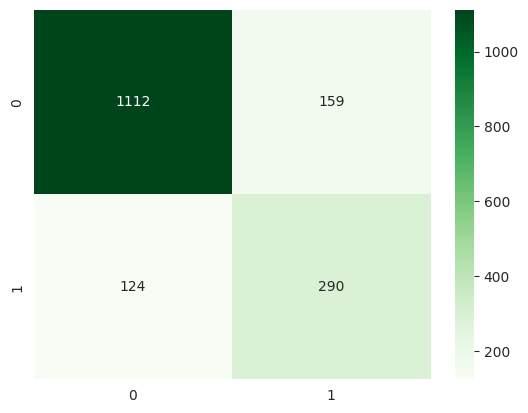

In [212]:
sns.heatmap(confusion_matrix(y_test, gbc_pred),fmt='0.9g', annot=True,cmap='Greens')

In [213]:
y_pred_proba = gbc.predict_proba(X_test)[:,1]
y_pred_proba

array([0.19203322, 0.06267715, 0.22309684, ..., 0.16276846, 0.25234509,
       0.31477975])

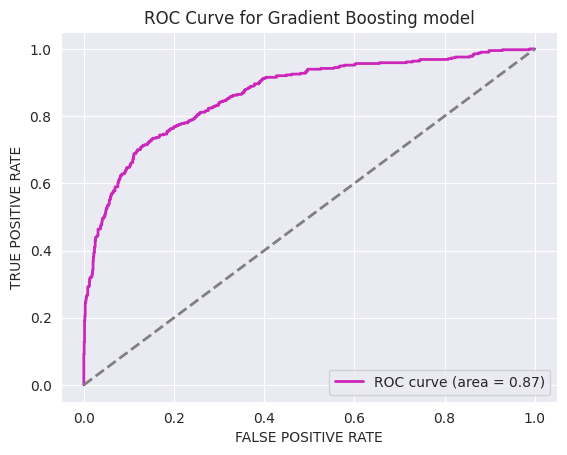

In [214]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#cb28bb', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for Gradient Boosting model')
plt.legend(loc="lower right")

<h2>KNN MODEL</h2>

In [215]:
from sklearn.neighbors import KNeighborsClassifier

In [216]:
knn = KNeighborsClassifier()

In [217]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [218]:
knn_pred = knn.predict(X_test)
knn_pred

array([1, 0, 0, ..., 0, 0, 0])

In [219]:
print('ACCURACY SCORE : ', accuracy_score(y_test, knn_pred))
print("Training accuracy: ",knn.score(X_train,y_train))
print("Test accuracy : ",knn.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, knn_pred))
print('\n\n \n---------Confusion Matrix--------------')
print(confusion_matrix(y_test,knn_pred))
print('\n\n \n---------Classification Report--------------')
print(classification_report(y_test,knn_pred))

ACCURACY SCORE :  0.7744807121661721
Training accuracy:  0.9055781522370715
Test accuracy :  0.7744807121661721
ROC AUC SCORE :  0.7031161510773593


 
---------Confusion Matrix--------------
[[1072  199]
 [ 181  233]]


 
---------Classification Report--------------
              precision    recall  f1-score   support

           0       0.86      0.84      0.85      1271
           1       0.54      0.56      0.55       414

    accuracy                           0.77      1685
   macro avg       0.70      0.70      0.70      1685
weighted avg       0.78      0.77      0.78      1685



In [220]:
knn_score=cross_val_score(knn,X,y,cv=5,scoring='accuracy')
print(knn_score)
print()
print("cross validation score for KNN :",np.mean(knn_score))

[0.81661721 0.78991098 0.7768546  0.79287834 0.82255193]

cross validation score for KNN : 0.7997626112759645


<Axes: >

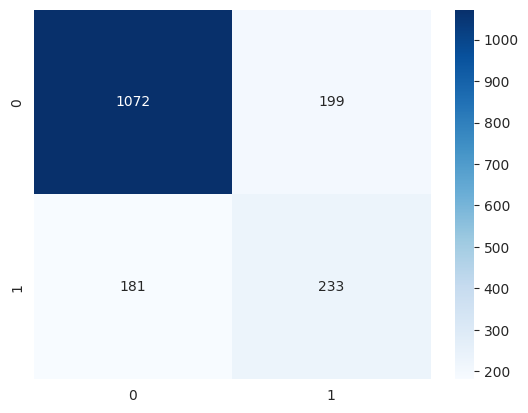

In [221]:
sns.heatmap(confusion_matrix(y_test, knn_pred),fmt='0.9g',annot=True,cmap='Blues')

In [222]:
y_pred_proba = knn.predict_proba(X_test)[:,1]
y_pred_proba

array([0.6, 0.2, 0.2, ..., 0. , 0. , 0.2])

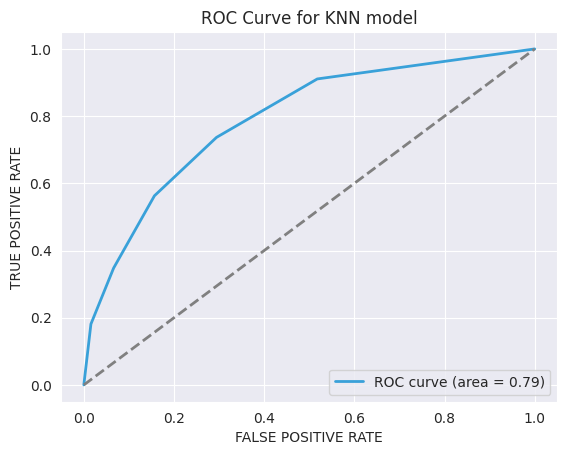

In [223]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#39a1d9', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for KNN model')
plt.legend(loc="lower right")

<h2>ADABOOST CLASSIFIER</h2>

In [224]:
from sklearn.ensemble import AdaBoostClassifier

In [225]:
adaboost = AdaBoostClassifier()

In [226]:
adaboost.fit(X_train, y_train)

AdaBoostClassifier()

In [227]:
adaboost_pred = adaboost.predict(X_test)
adaboost_pred

array([0, 0, 0, ..., 0, 0, 0])

In [228]:
print('ACCURACY SCORE : ', accuracy_score(y_test, adaboost_pred))
print("Training accuracy: ",adaboost.score(X_train,y_train))
print("Test accuracy : ",adaboost.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, adaboost_pred))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,adaboost_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,adaboost_pred))

ACCURACY SCORE :  0.8148367952522255
Training accuracy:  0.8455355413519272
Test accuracy :  0.8148367952522255
ROC AUC SCORE :  0.758368586490914


 
---------Confusion Matrix--------------

[[1105  166]
 [ 146  268]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.88      0.87      0.88      1271
           1       0.62      0.65      0.63       414

    accuracy                           0.81      1685
   macro avg       0.75      0.76      0.75      1685
weighted avg       0.82      0.81      0.82      1685



In [229]:
adaboost_score=cross_val_score(adaboost,X,y,cv=5,scoring='accuracy')
print(adaboost_score)
print()
print("cross validation score for ADABOOST :",np.mean(adaboost_score))

[0.83916914 0.79169139 0.75133531 0.57744807 0.84569733]

cross validation score for ADABOOST : 0.7610682492581602


<Axes: >

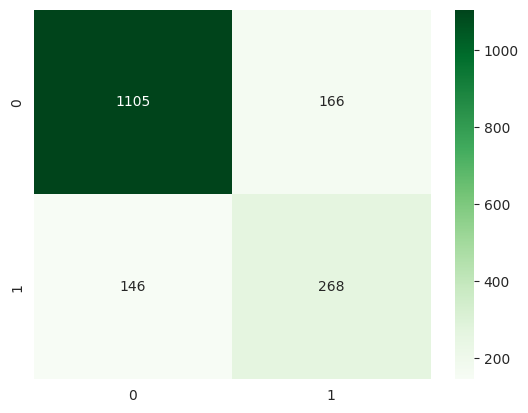

In [230]:
sns.heatmap(confusion_matrix(y_test, adaboost_pred),fmt='0.9g', annot=True,cmap='Greens')

In [231]:
y_pred_proba = adaboost.predict_proba(X_test)[:,1]
y_pred_proba

array([0.48747489, 0.48503227, 0.49356795, ..., 0.49525324, 0.49873912,
       0.49373184])

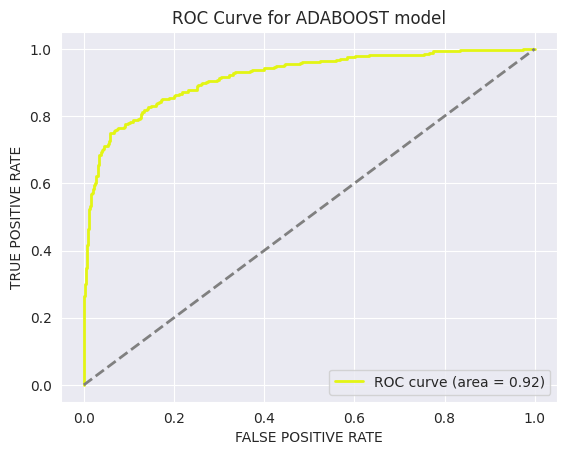

In [282]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#e3f514', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for ADABOOST model')
plt.legend(loc="lower right")

<h2>XGBOOST</h2>

In [233]:
from xgboost import XGBClassifier

In [234]:
xgb = XGBClassifier()

In [235]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [236]:
xgb_pred = xgb.predict(X_test)
xgb_pred

array([0, 0, 0, ..., 0, 0, 0])

In [237]:
print('ACCURACY SCORE : ', accuracy_score(y_test, xgb_pred))
print("Training accuracy: ", xgb.score(X_train, y_train))
print("Test accuracy : ", xgb.score(X_test, y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, xgb_pred))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, xgb_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test, xgb_pred))

ACCURACY SCORE :  0.8973293768545995
Training accuracy:  0.994673639356963
Test accuracy :  0.8973293768545995
ROC AUC SCORE :  0.8439948003968117


 
---------Confusion Matrix--------------

[[1206   65]
 [ 108  306]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.92      0.95      0.93      1271
           1       0.82      0.74      0.78       414

    accuracy                           0.90      1685
   macro avg       0.87      0.84      0.86      1685
weighted avg       0.89      0.90      0.90      1685



In [238]:
xgb_score = cross_val_score(xgb,X,y,cv=5,scoring='accuracy')
print(xgb_score)
print()
print("cross validation score for XGB :",np.mean(xgb_score))

[0.82195846 0.84985163 0.85816024 0.70267062 0.82195846]

cross validation score for XGB : 0.8109198813056379


<Axes: >

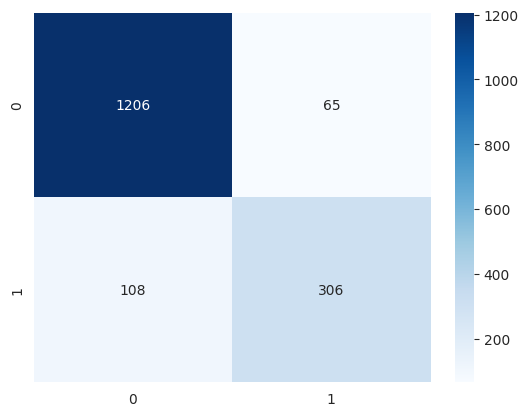

In [239]:
sns.heatmap(confusion_matrix(y_test,xgb_pred), annot=True, fmt='0.9g', cmap='Blues')

In [278]:
y_pred_proba = xgb.predict_proba(X_test)[:,1]
y_pred_proba

array([0.11579537, 0.01356006, 0.31735024, ..., 0.00318491, 0.00671617,
       0.06715726], dtype=float32)

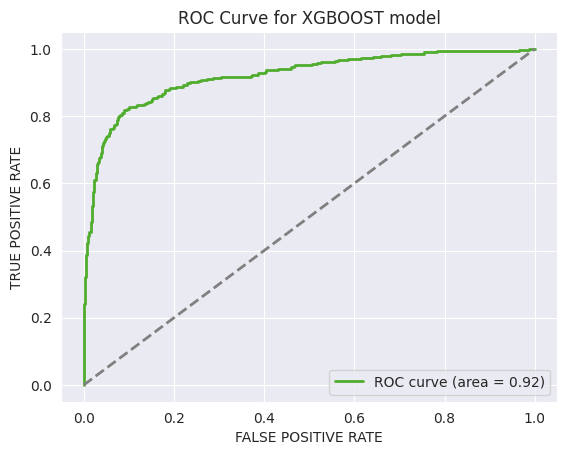

In [279]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#50ad2e', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for XGBOOST model')
plt.legend(loc="lower right")

<h2>CATBOOST</h2>

In [242]:
from catboost import CatBoostClassifier

In [243]:
cat = CatBoostClassifier(verbose=False)

In [244]:
cat.fit(X_train, y_train)

In [245]:
cat_pred = cat.predict(X_test)
cat_pred

array([0, 0, 0, ..., 0, 0, 0])

In [246]:
print('ACCURACY SCORE : ', accuracy_score(y_test, cat_pred))
print("Training accuracy: ",cat.score(X_train,y_train))
print("Test accuracy : ",cat.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, cat_pred))
print('\n\n \n---------Confusion Matrix--------------')
print(confusion_matrix(y_test,cat_pred))
print('\n\n \n---------Classification Report--------------')
print(classification_report(y_test,cat_pred))

ACCURACY SCORE :  0.8896142433234422
Training accuracy:  0.9709471237652527
Test accuracy :  0.8896142433234422
ROC AUC SCORE :  0.830737332618768


 
---------Confusion Matrix--------------
[[1203   68]
 [ 118  296]]


 
---------Classification Report--------------
              precision    recall  f1-score   support

           0       0.91      0.95      0.93      1271
           1       0.81      0.71      0.76       414

    accuracy                           0.89      1685
   macro avg       0.86      0.83      0.84      1685
weighted avg       0.89      0.89      0.89      1685



In [247]:
cat_score=cross_val_score(cat,X,y,cv=5,scoring='accuracy')
print(cat_score)
print()
print("cross validation score for CATBOOST :",np.mean(cat_score))

[0.83916914 0.83264095 0.82967359 0.65994065 0.84510386]

cross validation score for CATBOOST : 0.8013056379821958


<Axes: >

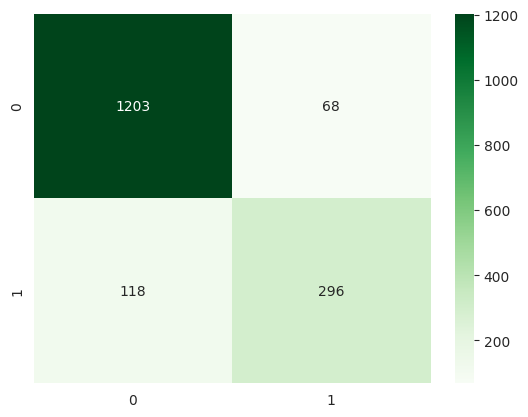

In [248]:
sns.heatmap(confusion_matrix(y_test, cat_pred),fmt='0.9g', annot=True,cmap='Greens')

In [280]:
y_pred_proba = cat.predict_proba(X_test)[:,1]
y_pred_proba

array([0.16424104, 0.02289011, 0.36074662, ..., 0.03544166, 0.02725871,
       0.13151064])

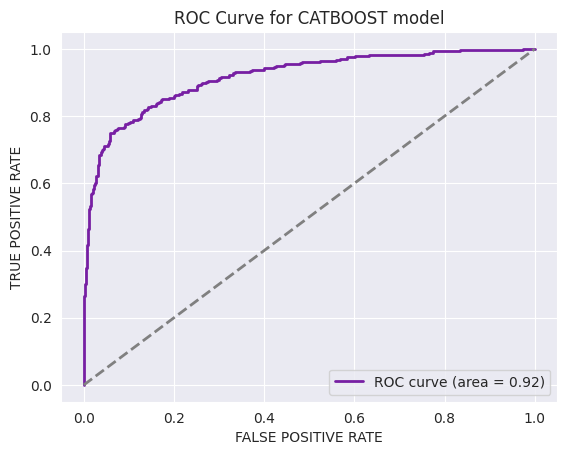

In [281]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#771fa3', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for CATBOOST model')
plt.legend(loc="lower right")

In [252]:
model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', 'KNN', 'ADABOOST', 'Gradient Boosting', 'XGBOOST', 'CATBOOST']
models = [log_pred, dtc_pred, rfc_pred, svc_pred, knn_pred,adaboost_pred, gbc_pred, xgb_pred, cat_pred]
accscorelist = []
for x in models:
    print(accuracy_score(y_test, x))
    accscorelist.append(accuracy_score(y_test, x))
print(accscorelist)

0.8267062314540059
0.8545994065281899
0.8985163204747775
0.8682492581602373
0.7744807121661721
0.8148367952522255
0.8320474777448071
0.8973293768545995
0.8896142433234422
[0.8267062314540059, 0.8545994065281899, 0.8985163204747775, 0.8682492581602373, 0.7744807121661721, 0.8148367952522255, 0.8320474777448071, 0.8973293768545995, 0.8896142433234422]


In [253]:
data = pd.DataFrame({
    'Model': model_names,
    'Accuracy Score': accscorelist
})
data = data.sort_values(by='Accuracy Score', ascending=False)

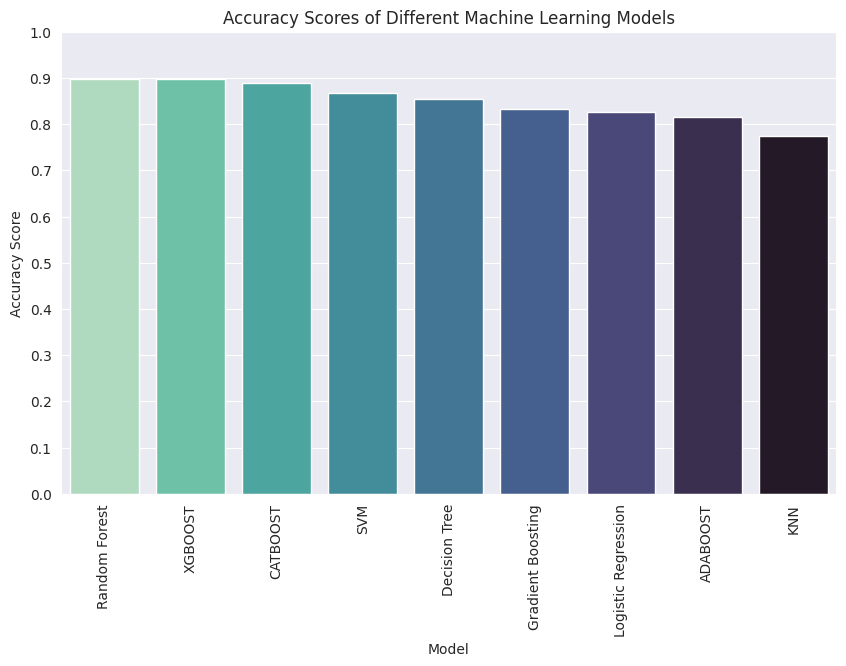

In [256]:
plt.figure(figsize=(10, 6))
sns.barplot(data=data, x='Model', y='Accuracy Score', palette='mako_r')
plt.title('Accuracy Scores of Different Machine Learning Models')
plt.xlabel('Model')
plt.ylabel('Accuracy Score')
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]) 
plt.xticks(rotation=90)
plt.show()

<p style="font-size:140%;color:#0c1fcc">Now, We have trained and tested all models and the best performing model is Random Forest Classifier which give 89% accuracy and 0.89 roc auc score.</h2>
<p style="font-size:140%;color:#aa55ff">Other models also performed really well and almost all other models like XGBOOST, CATBOOST gave similar accuracy.</p>
<p style="font-size:140%;color:#2badb4">No, we will try to hyperparameter tune our Random Forest model to see if we can improve even further.</p>

<h2>HYPERPARAMETER TUNING</h2>

In [257]:
from sklearn.model_selection import RandomizedSearchCV

In [263]:
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],  
    'max_depth': [None, 10, 20, 30, 40, 50],  
    'min_samples_split': [2, 5, 10],          
    'min_samples_leaf': [1, 2, 4],             
    'bootstrap': [True, False]                  
}

In [264]:
randomize = RandomizedSearchCV(RandomForestClassifier(), param_distributions=param_grid, scoring='accuracy',n_jobs=-1,cv=5, verbose=4)

In [265]:
randomize.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [None, 10, 20, 30, 40, 50],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500]},
                   scoring='accuracy', verbose=4)

In [266]:
randomize.best_score_

0.9230167663239021

In [267]:
randomize.best_params_

{'n_estimators': 100,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_depth': 50,
 'bootstrap': False}

In [268]:
best_model = randomize.best_estimator_

In [269]:
best_model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=False, max_depth=50, min_samples_leaf=2)

In [270]:
best_pred = best_model.predict(X_test)
best_pred

array([0, 0, 0, ..., 0, 0, 0])

In [271]:
print('ACCURACY SCORE : ', accuracy_score(y_test, best_pred))
print("Training accuracy: ",best_model.score(X_train,y_train))
print("Test accuracy : ",best_model.score(X_test,y_test))
print('ROC AUC SCORE : ', roc_auc_score(y_test, best_pred))
print('\n\n \n---------Confusion Matrix--------------')
print(confusion_matrix(y_test,best_pred))
print('\n\n \n---------Classification Report--------------')
print(classification_report(y_test,best_pred))

ACCURACY SCORE :  0.9026706231454006
Training accuracy:  0.9999031570792175
Test accuracy :  0.9026706231454006
ROC AUC SCORE :  0.8540500271762886


 
---------Confusion Matrix--------------
[[1207   64]
 [ 100  314]]


 
---------Classification Report--------------
              precision    recall  f1-score   support

           0       0.92      0.95      0.94      1271
           1       0.83      0.76      0.79       414

    accuracy                           0.90      1685
   macro avg       0.88      0.85      0.86      1685
weighted avg       0.90      0.90      0.90      1685



<Axes: >

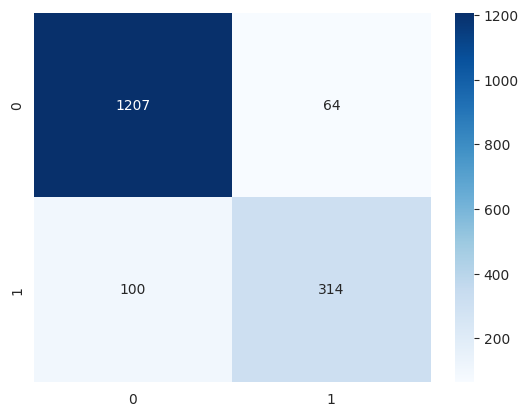

In [273]:
sns.heatmap(confusion_matrix(y_test, best_pred),fmt='0.9g',annot=True,cmap='Blues')

In [284]:
y_pred_proba = best_model.predict_proba(X_test)[:,1]
y_pred_proba

array([0.20636439, 0.02      , 0.25371429, ..., 0.02264286, 0.08383333,
       0.24077778])

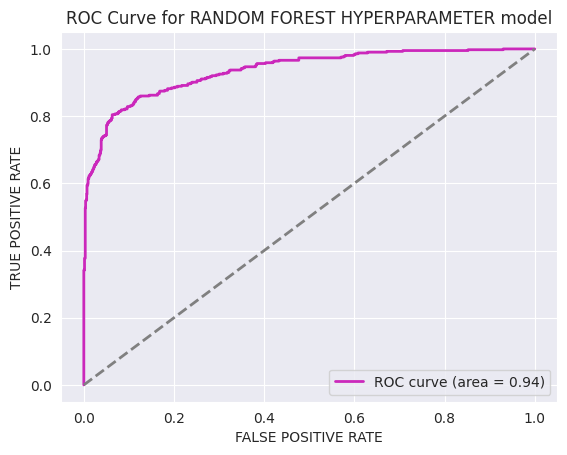

In [285]:
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color='#cb28bb', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('FALSE POSITIVE RATE')
plt.ylabel('TRUE POSITIVE RATE')
plt.title('ROC Curve for RANDOM FOREST HYPERPARAMETER model')
plt.legend(loc="lower right")

<p style="font-size:120%;color:#4a67aa">We can see that after hypeparamter tuning techniques like RandomizedSearch we can improve the model by a slight margin. The model now gives 90% accuracy which is fantastic. So, we will stop here and save the model using joblib library for further reference.</p>

<h2 style="color:purple">SAVING THE MODEL</h2>

In [286]:
joblib.dump(best_model, 'Rain_Tomorrow_Classification.pkl')

['Rain_Tomorrow_Classification.pkl']

<h1>DOCUMENTATION ⬇️<h1>

<p style="font-size:140%;color:#797979">We first imported the dataset using pandas dataframe and did some visual representation of the dataset,created new columns 'Year', 'Month' using Date column and then cleaned the dataset by filling null values with most frequent values as per the situation and fille the numerical column null values with the mean values. Then, we did label encoding on RainTomorrow column and one hot encoding on categorical columns like 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm' etc. SMOTE was used for handling imbalanced data. YEO JOHNSON POWER TRANSFORMER was used to remove skewness from Evaporation Column. Then, we split the data into training and testing data and then scaled the data using Standard Scaler.</p>
<br>
<p style="font-size:140%;color:#797979">One important thing to note is that we built two models different one to predict the amount of rainfall and the second one to predict whether it will rain tomorrow or not ?</p>
<br>
<p style="font-size:140%;color:#797979">We then trained multiple models to predict the amount of Rainfall and tested them and the results are given below.</p>
<br>
<p style="font-size:140%;color:#797979">The model chosen for this task is a supervised learning model suitable for regression tasks. The following models were evaluated:</p>

<p style="font-size:120%;color:#797979">
    <ul style="font-size:140%;color:#797979">
        <li>Linear Regression</li>
        <li>Decision Tree</li>
        <li>Random Forest</li>
        <li>SVM</li>
        <li>KNN</li>
        <li>Gradient Boosting</li>
        <li>XGBOOST</li>
        <li>CatBoosting</li>
    </ul>
</p>
<br>
<p style="font-size:140%;color:#797979">The selected model Catboost was trained using a training dataset split from the original dataset. Cross-validation was used to tune hyperparameters to optimize performance metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), Root Mean Squared Error(RMSE), R2 SCORE and Mean Absolute Percentage Error.
</p>
<br>
<p style="font-size:140%;color:#797979">CATBOOST RAINFALL PREDICTION MODEL RESULTS : ⤵️ </p>

<pre style="font-size:140%;color:#797979">⚫ The mean absolute error (MAE) is 2.275486067036413

⚫ The mean sqaured error (MSE) is 51.64471914644058

⚫ The root mean sqaured error (RMSE) is 7.1864260342983135

⚫ The R2 SCORE is 0.6492445643024873

⚫ Training r2 score is 0.930147692312611

⚫ The mean absolute percentage error is 1072383898084018.0
</pre>
<hr>
<p style="font-size:140%;color:#797979">The next model chosen for predicting the whether it will rain tomorrow is a supervised learning model suitable for binary classification tasks. The following models were evaluated:</p>
<p style="font-size:120%;color:#797979">
    <ul style="font-size:140%;color:#797979">
        <li>Logistic Regression</li>
        <li>Decision Tree</li>
        <li>Random Forest</li>
        <li>SVM</li>
        <li>KNN</li>
        <li>AdaBoost</li>
        <li>Gradient Boosting</li>
        <li>XGBOOST</li>
        <li>CatBoosting</li>
    </ul>
</p>
<br>
<p style="font-size:140%;color:#797979">The selected model Random Forest was trained using a training dataset split from the original dataset. Cross-validation was used to tune hyperparameters to optimize performance metrics such as accuracy, precision, recall, F1 Score, AUC and ROC AUC SCORE.
</p>
<p style="font-size:140%;color:#797979">RANDOM FOREST MODEL RESULTS : ⤵️</p>

<pre style="font-size:140%;color:#797979">⚫ ACCURACY SCORE :  0.9026706231454006
    
⚫ Training accuracy:  0.9999031570792175
    
⚫ ROC AUC SCORE :  0.8540500271762886

⚫ AREA UNDER CURVE (AUC) : 0.94

⚫ Precision :
    ➡️ Macro : 0.88
    ➡️ Weighted : 0.90
    
⚫ Recall : 
    ➡️ Macro : 0.85
    ➡️ Weighted : 0.90
    
⚫ F1-score :
    ➡️ Macro : 0.86
    ➡️ Weighted : 0.90
</pre>
<hr>
<p style="font-size:140%;color:#797979">The two models created are very robust and up to date models which are able to predict the amount of rainfall expected and whether it will rain tomorrow or not ? These two models will predict based on various geographical metrics.</p>
<hr>

<h1>THANK YOU</h1>